In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import phik

## EDA for 2 files application_train and previous_application

## READ

In [2]:
train = pd.read_csv("../data/dseb63_application_train.csv")
prev = pd.read_csv("../data/dseb63_previous_application.csv")
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None) 

In [3]:
def plot_phik_matrix(data, categorical_columns, figsize = (20,20), mask_upper = True, tight_layout = True, linewidth = 0.1, fontsize = 10, cmap = 'Greens', show_target_top_corr = True, target_top_columns = 10):
    
    data_for_phik = data[categorical_columns].astype('object')
    phik_matrix = data_for_phik.phik_matrix()
    
    print('-'*100)
    
    if mask_upper:
        mask_array = np.ones(phik_matrix.shape)
        mask_array = np.triu(mask_array)
    else:
        mask_array = np.zeros(phik_matrix.shape)
        
    plt.figure(figsize = figsize, tight_layout = tight_layout)
    sns.heatmap(phik_matrix, annot = False, mask = mask_array, linewidth = linewidth, cmap = cmap)
    plt.xticks(rotation = 90, fontsize = fontsize)
    plt.yticks(rotation = 0, fontsize = fontsize)
    plt.title("Phi-K Correlation Heatmap for Categorical Features")
    plt.show()

    if show_target_top_corr:
        print("Categories with highest values of Phi-K Correlation value with Target Variable are:")
        phik_df = pd.DataFrame({'Column Name' : phik_matrix.TARGET.index[1:], 'Phik-Correlation' : phik_matrix.TARGET.values[1:]})
        phik_df = phik_df.sort_values(by = 'Phik-Correlation', ascending = False)
        display(phik_df.head(target_top_columns))


In [4]:
class correlation_matrix:
    
    def __init__(self, data, columns_to_drop, figsize = (25,23), mask_upper = True, tight_layout = True, 
                  linewidth = 0.1, fontsize = 10, cmap = 'Blues'):  

        self.data = data
        self.columns_to_drop = columns_to_drop
        self.figsize = figsize
        self.mask_upper = mask_upper
        self.tight_layout = tight_layout
        self.linewidth = linewidth
        self.fontsize = fontsize
        self.cmap = cmap 
                 
    def plot_correlation_matrix(self):
        '''
        Function to plot the Correlation Matrix Heatmap
        
        Inputs:
            self
        
        Returns:
            None
        '''
        
        self.corr_data = self.data.drop(self.columns_to_drop + ['TARGET'], axis = 1).corr()

        if self.mask_upper:
            mask_array = np.ones(self.corr_data.shape)
            mask_array = np.triu(mask_array)
        else:
            mask_array = np.zeros(self.corr_data.shape)

        plt.figure(figsize = self.figsize, tight_layout = self.tight_layout)
        sns.heatmap(self.corr_data, annot = False, mask = mask_array, linewidth = self.linewidth, cmap = self.cmap)
        plt.xticks(rotation = 90, fontsize = self.fontsize)
        plt.yticks(fontsize = self.fontsize)
        plt.title("Correlation Heatmap for Numerical features")
        plt.show()
    
    def target_top_corr(self, target_top_columns = 10):
        phik_target_arr = np.zeros(self.corr_data.shape[1])
        for index, column in enumerate(self.corr_data.columns):
            phik_target_arr[index] = self.data[['TARGET', column]].phik_matrix().iloc[0,1]
        top_corr_target_df = pd.DataFrame({'Column Name': self.corr_data.columns, 'Phik-Correlation' : phik_target_arr})
        top_corr_target_df = top_corr_target_df.sort_values(by = 'Phik-Correlation', ascending = False)
        
        return top_corr_target_df.iloc[:target_top_columns]

In [5]:
def plot_categorical_variables_pie(data, column_names, plot_defaulter=True, hole=0):
    for column_name in column_names:
        if plot_defaulter:
            cols = 2
            specs = [[{'type' : 'domain'}, {'type' : 'domain'}]]
            titles = [f'Distribution of {column_name} for all Targets', f'Percentage of Defaulters for each category of {column_name}']
        else:
            cols = 1
            specs = [[{'type': 'domain'}]]
            titles = [f'Distribution of {column_name} for all Targets']
            
        values_categorical = data[column_name].value_counts()
        labels_categorical = values_categorical.index
        
        custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

        
        fig = make_subplots(rows = 1, cols = cols, 
                        specs = specs, 
                        subplot_titles = titles)
        
        fig.add_trace(go.Pie(values = values_categorical, labels = labels_categorical, hole = hole, 
                            textinfo = 'label+percent', textposition = 'inside'), row = 1, col = 1)
        
        if plot_defaulter:
            percentage_defaulter_per_category = data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()
            percentage_defaulter_per_category.dropna(inplace = True)
            percentage_defaulter_per_category = percentage_defaulter_per_category.round(2)
            
            fig.add_trace(go.Pie(values = percentage_defaulter_per_category, labels = percentage_defaulter_per_category.index, 
                                hole = hole, textinfo = 'label+value', hoverinfo = 'label+value'), row = 1, col = 2)
            
        fig.update_layout(title = f'Distribution of {column_name}')
        fig.show()

In [6]:
def plot_categorical_variables_bar(data, column_names, figsize = (18,6), percentage_display = True, plot_defaulter = True, rotation = 0, horizontal_adjust = 0, fontsize_percent = 'xx-small'):    
    for column_name in column_names:
        print(f"Total Number of unique categories of {column_name} = {len(data[column_name].unique())}")
        
        plt.figure(figsize = figsize, tight_layout = False)
        sns.set(style = 'whitegrid', font_scale = 1.2)
        
        plt.subplot(1,2,1)
        data_to_plot = data[column_name].value_counts().sort_values(ascending = False)
        ax = sns.barplot(x = data_to_plot.index, y = data_to_plot, palette = 'Set1')
        
        if percentage_display:
            total_datapoints = len(data[column_name].dropna())
            for p in ax.patches:
                ax.text(p.get_x() + horizontal_adjust, p.get_height() + 0.005 * total_datapoints, '{:1.02f}%'.format(p.get_height() * 100 / total_datapoints), fontsize = fontsize_percent)
            
        plt.xlabel(column_name, labelpad = 10)
        plt.title(f'Distribution of {column_name}', pad = 20)
        plt.xticks(rotation = rotation)
        plt.ylabel('Counts')
        
        if plot_defaulter:
            percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()).dropna().sort_values(ascending = False)

            plt.subplot(1,2,2)
            sns.barplot(x = percentage_defaulter_per_category.index, y = percentage_defaulter_per_category, palette = 'Set2')
            plt.ylabel('Percentage of Defaulter per category')
            plt.xlabel(column_name, labelpad = 10)
            plt.xticks(rotation = rotation)
            plt.title(f'Percentage of Defaulters for each category of {column_name}', pad = 20)
        plt.show()

In [7]:
def visualize_missing_data(df):
    nan_percentage = df.isnull().mean() * 100
    nan_percentage = nan_percentage[nan_percentage > 0]
    nan_percentage = nan_percentage.sort_values(ascending=False)
    print (len(nan_percentage))
    
    plt.figure(figsize=(12,6))
    ax = sns.barplot(x=nan_percentage.index, y=nan_percentage.values, palette='Blues_d')  
    
    plt.title('Percentage of Missing Values by Column', fontsize=16)
    plt.xlabel('Columns', fontsize=14)
    plt.ylabel('Percentage of Missing Data (%)', fontsize=14)
    plt.xticks(rotation=90, ha='right')  
    

    plt.tight_layout()  
    plt.show()

    return nan_percentage



In [8]:
def univariate_barplots_prev(data, col1, col2 = "NAME_CONTRACT_STATUS", top=False):
    data[col1] = data[col1].fillna('Missing')

    temp = data.groupby([col1, col2]).size().unstack(fill_value=0).reset_index()
    total_count = len(data)

    for col in temp.columns[1:]:
        temp[col] = (temp[col] / total_count) * 100  

    if top:
        temp = temp.sort_values(by='total', ascending=False).head(10)

    return temp

def stack_plot_prev(data, xticks, col2 = "NAME_CONTRACT_STATUS", col3='total', figsize=(18, 6), rotation=0, horizontal_adjust=0, fontsize_percent='xx-small', plot_defaulter=True):
    for xtick in xticks:
        temp = univariate_barplots_prev(data, xtick, col2)
        ind = np.arange(temp.shape[0])
        temp['total_sum'] = temp.iloc[:, 1:].sum(axis=1)
        
        max_value = temp['total_sum'].max()

        fig, axes = plt.subplots(1, 3, figsize=figsize)
        colors = plt.cm.Paired(np.linspace(0, 1, temp.shape[1] - 1))
        bottom_data = np.zeros(temp.shape[0])
        
        for i, col in enumerate(temp.columns[1:-1]): 
            axes[0].bar(ind, temp[col].values, bottom=bottom_data, color=colors[i], label=col)
            bottom_data += temp[col].values  

        axes[0].set_ylabel('Percentage')
        axes[0].set_title(f'{col2} vs {xtick}')
        axes[0].set_xticks(ind)
        axes[0].set_xticklabels(temp[xtick].values, rotation=rotation)

        axes[0].set_ylabel('Percentage')
        axes[0].set_title(f'{col2} vs {xtick}')
        axes[0].set_xticks(ind)
        axes[0].set_xticklabels(temp[xtick].values, rotation=rotation)
        axes[0].set_ylim(0, max_value)
        axes[0].set_ylabel('Percentage (%)')
        axes[0].set_title(f'{col2} distribution by {xtick}')
        axes[0].set_xticks(ind)
        axes[0].set_xticklabels(temp[xtick], rotation=rotation)
        axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=fontsize_percent)
        plt.xticks(rotation=rotation, ha='right')  


        if plot_defaulter:
            percentage_defaulter_per_category = (data[xtick][data.TARGET == 1].value_counts() * 100 / data[xtick].value_counts()).dropna().sort_values(ascending = False)

            axes[1].bar(percentage_defaulter_per_category.index, percentage_defaulter_per_category.values, color='salmon')
            axes[1].set_ylabel('Percentage of Defaulters (%)')
            axes[1].set_xlabel(f'{xtick} categories', labelpad=10)
            axes[1].set_title(f'Percentage of Defaulters for each {xtick}')
            axes[1].set_xticklabels(percentage_defaulter_per_category.index, rotation=rotation, ha='right')



        percentage_defaulter_per_aa = (data[xtick][data.TARGET == 1].value_counts() * 100 / len(data)).dropna().sort_values(ascending=False)

        axes[2].bar(percentage_defaulter_per_aa.index, percentage_defaulter_per_aa.values, color='green')
        axes[2].set_ylabel('Percentage of Defaulters (%)')
        axes[2].set_xlabel(f'{xtick} categories', labelpad=10)
        axes[2].set_title(f'Percentage of Defaulters for each {xtick} in all defaulters')

        plt.tight_layout()
        plt.xticks(rotation=rotation, ha='right')  

        plt.show()

In [9]:
def plot_continuous_variables(data, columns, plots = ['distplot', 'CDF', 'box'], scale_limits = None, figsize = (20,8), histogram = True, log_scale = False):
    for column_name in columns:
        data_to_plot = data.copy()
        if scale_limits:
            data_to_plot[column_name] = data[column_name][(data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

        number_of_subplots = len(plots)
        plt.figure(figsize = figsize)
        sns.set_style('whitegrid')
        
        for i, ele in enumerate(plots):
            plt.subplot(1, number_of_subplots, i + 1)
            plt.subplots_adjust(wspace=0.25)
            
            if ele == 'CDF':
                percentile_values_0 = data_to_plot[data_to_plot.TARGET == 0][[column_name]].dropna().sort_values(by = column_name)
                percentile_values_0['Percentile'] = [ele / (len(percentile_values_0)-1) for ele in range(len(percentile_values_0))]
                
                percentile_values_1 = data_to_plot[data_to_plot.TARGET == 1][[column_name]].dropna().sort_values(by = column_name)
                percentile_values_1['Percentile'] = [ele / (len(percentile_values_1)-1) for ele in range(len(percentile_values_1))]
                
                plt.plot(percentile_values_0[column_name], percentile_values_0['Percentile'], color = 'red', label = 'Non-Defaulters')
                plt.plot(percentile_values_1[column_name], percentile_values_1['Percentile'], color = 'black', label = 'Defaulters')
                plt.xlabel(column_name)
                plt.ylabel('Probability')
                plt.title('CDF of {}'.format(column_name))
                plt.legend(fontsize = 'medium')
                if log_scale:
                    plt.xscale('log')
                    plt.xlabel(column_name + ' - (log-scale)')
                
            if ele == 'distplot':  
                sns.distplot(data_to_plot[column_name][data['TARGET'] == 0].dropna(),
                            label='Non-Defaulters', hist = False, color='red')
                sns.distplot(data_to_plot[column_name][data['TARGET'] == 1].dropna(),
                            label='Defaulters', hist = False, color='black')
                plt.xlabel(column_name)
                plt.ylabel('Probability Density')
                plt.legend(fontsize='medium')
                plt.title("Dist-Plot of {}".format(column_name))
                if log_scale:
                    plt.xscale('log')
                    plt.xlabel(f'{column_name} (log scale)')


            if ele == 'box':  
                sns.boxplot(x='TARGET', y=column_name, data=data_to_plot)
                plt.title("Box-Plot of {}".format(column_name))
                if log_scale:
                    plt.yscale('log')
                    plt.ylabel(f'{column_name} (log Scale)')

        plt.show()

In [10]:
def count_unique_values(data):
    result_dict = {}
    
    for column in data.columns:
        unique_counts = data[column].value_counts(dropna=False)
        total = len(data[column])  
        percent_counts = round((unique_counts / total) * 100, 3)
        
        if len(unique_counts) <= 30:  
            result_dict[column] = {
                'counts': unique_counts.to_dict(),  
                'percentages': percent_counts.to_dict() 
            }
    
    return result_dict

## TRAIN

#### Overall Insights

In this loan applicant dataset, **cash loans** dominate the applications, representing over 90% of the total loans, with a higher default rate (above 8%) compared to **revolving loans** (just over 5%). While there are more **female applicants**, **male applicants** tend to default at a higher rate, making them more financially risky. **Laborers**, who make up the largest portion of applicants (26.17%), show a significant risk of default, especially **low-skill laborers** who, despite their small number, have the highest default rates. **Sales staff**, **core staff**, and **drivers** also face higher default risks, while those in **high-skill technical** roles, such as **IT staff**, have much lower default rates. In terms of **education**, most applicants have **secondary** education, with **lower secondary** applicants showing the highest likelihood of default, despite their low numbers. When analyzing **housing types**, applicants living in **rented apartments** or with **co-op apartments** exhibit a higher default rate, indicating financial instability linked to their living situations. Overall, the data suggests that factors like **occupation**, **education**, and **housing type** can be strong indicators of default risk, with certain groups, such as **low-skill laborers**, exhibiting the highest financial vulnerability.


Defaulters are typically individuals with unstable financial backgrounds, including low-skill laborers, males, those with lower education levels, applicants for cash loans, and people living in rented or co-op apartments, often showing mismatched address details, indicating higher financial risk.

#### Basic stat and correlation

In [11]:
# train.drop(train.columns[0], axis=1, inplace=True)
train.columns

Index(['Unnamed: 0', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'SK_ID_CURR'],
      dtype='object', length=123)

In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246009 entries, 0 to 246008
Columns: 123 entries, Unnamed: 0 to SK_ID_CURR
dtypes: float64(65), int64(42), object(16)
memory usage: 230.9+ MB


In [13]:
train.describe()

,Unnamed: 0,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_CURR
count,246009.000000,246009.000000,246009.000000,2.460090e+05,2.460090e+05,245999.000000,2.457850e+05,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,83821.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246008.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,107484.000000,2.454800e+05,197185.000000,121025.000000,101993.000000,125927.000000,82325.000000,74079.000000,114800.000000,122060.000000,123476.000000,79054.000000,99879.000000,77812.000000,122421.000000,75140.000000,110065.000000,121025.000000,101993.000000,125927.000000,82325.000000,74079.000000,114800.000000,122060.000000,123476.000000,79054.000000,99879.000000,77812.000000,122421.000000,75140.000000,110065.000000,121025.000000,101993.000000,125927.000000,82325.000000,74079.000000,114800.000000,122060.000000,123476.000000,79054.000000,99879.000000,77812.000000,122421.000000,75140.000000,110065.000000,127190.000000,245204.000000,245204.000000,245204.000000,245204.000000,246008.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,246009.000000,212798.000000,212798.000000,212798.000000,212798.000000,212798.000000,212798.000000,246009.000000
mean,123004.000000,0.080794,0.416229,1.684589e+05,5.996410e+05,27120.238129,5.389827e+05,0.020855,-16038.946343,63852.612441,-4985.222248,-2992.974509,12.042293,0.999996,0.819787,0.198928,0.998114,0.280665,0.056961,2.152637,2.052616,2.031682,12.063372,0.015227,0.050921,0.040686,0.078363,0.230142,0.179148,0.502462,5.143854e-01,0.511034,0.117422,0.088463,0.977713,0.752876,0.044533,0.079023,0.149660,0.226512,0.232112,0.066439,0.100839,0.107483,0.008882,0.028339,0.114131,0.087532,0.977049,0.760014,0.042453,0.074538,0.145133,0.222510,0.228227,0.065007,0.105644,0.105985,0.008141,0.026954,0

- **TARGET**: Only ~8% defaulters, indicating imbalanced data.
- **Financial Features**: High variability in income, credit amount, and loan price.
- **Age and Employment**: Clients are mostly middle-aged; some employment data anomalies.
- **Regional**: Most clients live in less populated areas.
- **Key Correlations**: **EXT_SOURCE_1-3**, **DAYS_BIRTH**, and **DAYS_EMPLOYED** show potential for predictive power.
- **Document Flags**: Show mixed relevance and might affect model complexity.

In [14]:
print ("duplicate",train.shape[0] - train.duplicated().shape[0])
print("file shape", train.shape)
print("unique id value",len(train["SK_ID_CURR"].unique()))

duplicate 0
file shape (246009, 123)
unique id value 246009


In [15]:

#Ratio: value ask / value received percentage
prev_merge = train.drop(train[train['AMT_CREDIT'].isnull() == True].index)


train['RATIO_GOODS_TO_ANNUITY'] =  train['AMT_GOODS_PRICE'] / train['AMT_ANNUITY'] * (train['AMT_ANNUITY'] != 0)


#Separate weekend from weekdays
train["WEEKDAY_APPR_PROCESS_START"] = train["WEEKDAY_APPR_PROCESS_START"].replace(['MONDAY','TUESDAY', 'WEDNESDAY','THURSDAY','FRIDAY'], 'WEEK_DAY')
train["WEEKDAY_APPR_PROCESS_START"] = train["WEEKDAY_APPR_PROCESS_START"].replace(['SATURDAY', 'SUNDAY'], 'WEEKEND')
train["WEEKDAY_APPR_PROCESS_START"].fillna('WEEK_DAY', inplace=True)


#Separate working hours from off_hours
train["HOUR_APPR_PROCESS_START"] = train["HOUR_APPR_PROCESS_START"].replace([8,9,10,11,12,13,14,15,16,17], 'working_hours')
train["HOUR_APPR_PROCESS_START"] = train["HOUR_APPR_PROCESS_START"].replace([18,19,20,21,22,23,0,1,2,3,4,5,6,7], 'off_hours')

#ti le gia tri goods va so tien vay
train['GOODS_PRICE_RATIO'] = train['AMT_GOODS_PRICE'] / train['AMT_CREDIT']


#neu don xin vay vao cuoi tuan
train['WEEKDAY_ACTIVE'] = train['WEEKDAY_APPR_PROCESS_START'].isin(["WEEKEND"])

/tmp/ipykernel_2261849/737441361.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train["WEEKDAY_APPR_PROCESS_START"].fillna('WEEK_DAY', inplace=True)


In [16]:
# train.columns[train.notna().all()].tolist()

/tmp/ipykernel_2261849/2922345595.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=nan_percentage.index, y=nan_percentage.values, palette='Blues_d')


69


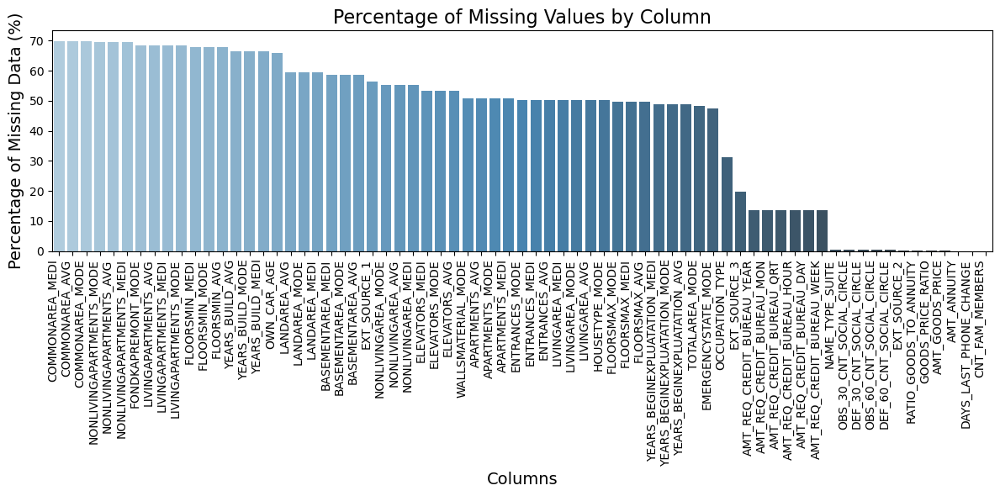

In [17]:
train_nan = visualize_missing_data(train)
train_unique = count_unique_values(train)
defau = train_unique["TARGET"]

 high NaN percentages in property-related features (common areas, non-living spaces, renovations) suggest incomplete or non-standardized data collection, while low NaN values in basic attributes like building age indicate more consistent data availability.

In [18]:
plot_categorical_variables_pie(train, ["TARGET"], plot_defaulter= False)

Data imbalance

In [19]:
len(train_nan)
train_nan.index

Index(['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE',
       'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MEDI',
       'LIVINGAPARTMENTS_MODE', 'FLOORSMIN_MEDI', 'FLOORSMIN_MODE',
       'FLOORSMIN_AVG', 'YEARS_BUILD_AVG', 'YEARS_BUILD_MODE',
       'YEARS_BUILD_MEDI', 'OWN_CAR_AGE', 'LANDAREA_AVG', 'LANDAREA_MODE',
       'LANDAREA_MEDI', 'BASEMENTAREA_MEDI', 'BASEMENTAREA_MODE',
       'BASEMENTAREA_AVG', 'EXT_SOURCE_1', 'NONLIVINGAREA_MODE',
       'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'ELEVATORS_MEDI',
       'ELEVATORS_MODE', 'ELEVATORS_AVG', 'WALLSMATERIAL_MODE',
       'APARTMENTS_AVG', 'APARTMENTS_MODE', 'APARTMENTS_MEDI',
       'ENTRANCES_MODE', 'ENTRANCES_MEDI', 'ENTRANCES_AVG', 'LIVINGAREA_MEDI',
       'LIVINGAREA_MODE', 'LIVINGAREA_AVG', 'HOUSETYPE_MODE', 'FLOORSMAX_MODE',
       'FLOORSMAX_MEDI', 'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MEDI

----------------------------------------------------------------------------------------------------


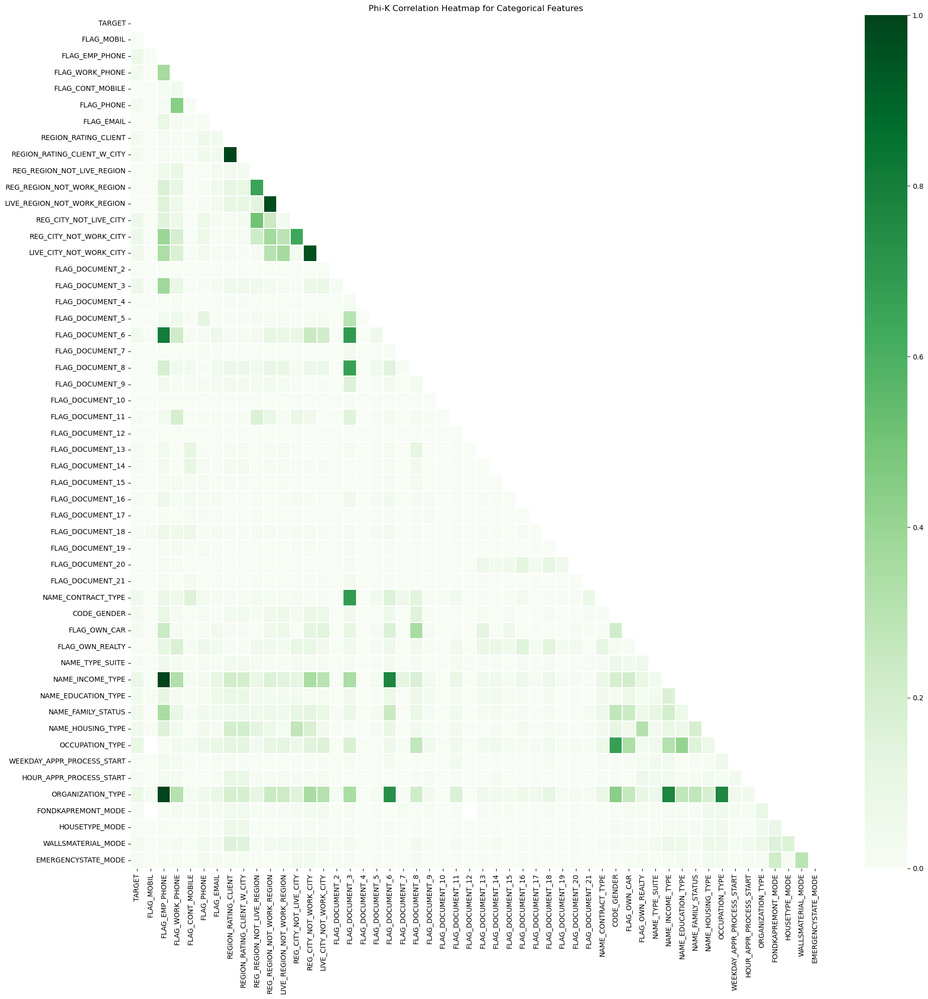

Categories with highest values of Phi-K Correlation value with Target Variable are:


,Column Name,Phik-Correlation
43,OCCUPATION_TYPE,0.100618
46,ORGANIZATION_TYPE,0.089738
39,NAME_INCOME_TYPE,0.082585
12,REG_CITY_NOT_WORK_CITY,0.079965
1,FLAG_EMP_PHONE,0.071581
15,FLAG_DOCUMENT_3,0.069821
11,REG_CITY_NOT_LIVE_CITY,0.069703
41,NAME_FAMILY_STATUS,0.056126
13,LIVE_CITY_NOT_WORK_CITY,0.051984
34,NAME_CONTRACT_TYPE,0.049651


In [20]:
train_cate = ['TARGET','FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                                   'FLAG_PHONE', 'FLAG_EMAIL','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY',
                                  'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
                                   'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 
                                'LIVE_CITY_NOT_WORK_CITY'] + ['FLAG_DOCUMENT_' + str(i) for i in range(2,22)] + train.dtypes[
                                    train.dtypes == 'object'].index.tolist()

plot_phik_matrix(train, train_cate)

top columns with the highest Phi-K correlation to the target variable are related to employment, income type, and geographical factors, indicating their influence on loan repayment behavior.

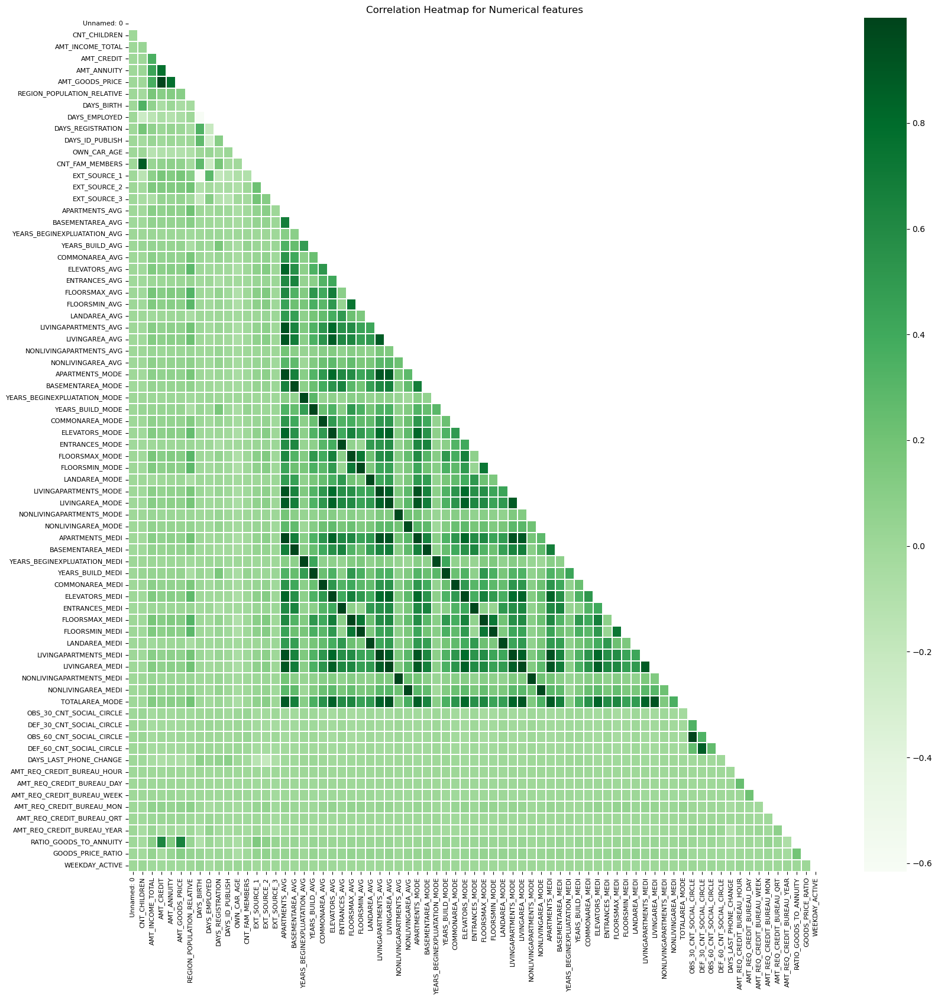

In [21]:
columns_to_drop = ['SK_ID_CURR'] + list(set(train_cate) - set(['TARGET']))
corr_mat = correlation_matrix(train, columns_to_drop, figsize = (17,17), fontsize = 8, cmap = 'Greens')
corr_mat.plot_correlation_matrix()

In [22]:
top_corr_target_df = corr_mat.target_top_corr()
top_corr_target_df

interval columns not set, guessing: ['TARGET', 'Unnamed: 0']
interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'REGION_POPULATION_RELATIVE']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'DAYS_REGISTRATION']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'OWN_CAR_AGE']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns not set, gues

,Column Name,Phik-Correlation
15,EXT_SOURCE_3,0.249366
13,EXT_SOURCE_1,0.213658
14,EXT_SOURCE_2,0.211522
7,DAYS_BIRTH,0.101565
71,GOODS_PRICE_RATIO,0.075094
70,RATIO_GOODS_TO_ANNUITY,0.072901
8,DAYS_EMPLOYED,0.071599
63,DAYS_LAST_PHONE_CHANGE,0.071180
10,DAYS_ID_PUBLISH,0.068400
5,AMT_GOODS_PRICE,0.060560


- The strongest predictors of loan default, as shown by the Phi-K correlations, are the external sources of credit data, particularly __EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3__, highlighting the importance of external credit history and behavior in assessing risk. __Demographic features__ like DAYS_BIRTH (age) have some predictive value, while __financial ratios__ like GOODS_PRICE_RATIO offer moderate but useful insights. Features like DAYS_EMPLOYED, DAYS_LAST_PHONE_CHANGE, and AMT_GOODS_PRICE show weaker correlations, suggesting that while they provide some information, they are not as impactful as external credit data in predicting loan repayment behavior.

- __High correlation__ is seen among apartment statistics (e.g., living area, basement area) and financial features like AMT_GOODS_PRICE and AMT_CREDIT

#### CONTRACT_TYPE

- Loan Type Imbalance: Cash loans dominate (90.44%) compared to Revolving loans (9.56%).
- Over >8% default rate in Cash loans and >5% in Revolving loans --> __default reate on cash loans is higher than revolving loans__

Total Number of unique categories of NAME_CONTRACT_TYPE = 2


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




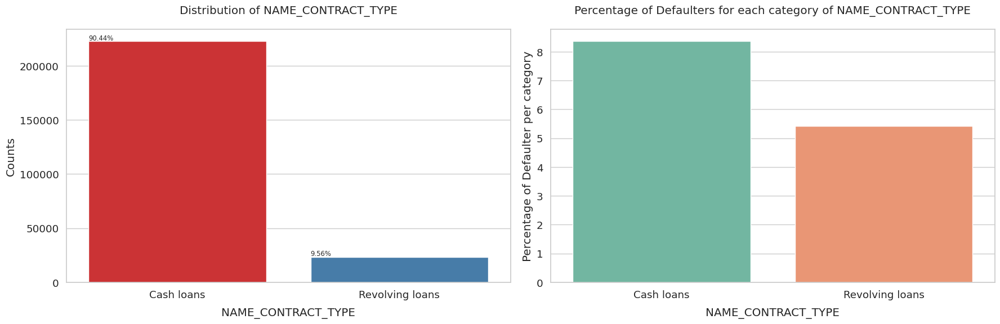

In [23]:
plot_categorical_variables_bar(train, ["NAME_CONTRACT_TYPE"])

In [24]:
train_unique["NAME_CONTRACT_TYPE"]

{'counts': {'Cash loans': 222491, 'Revolving loans': 23518},
 'percentages': {'Cash loans': 90.44, 'Revolving loans': 9.56}}

#### CODE_GENDER

- Higher proportion of female applicants compared to male applicants. However, male have higher default rate --> for this dataset, males are more likely to default on loans than females
- 3 XNA value represent invalid data and this belong to non-defaulters --> should be removed

Total Number of unique categories of CODE_GENDER = 3


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




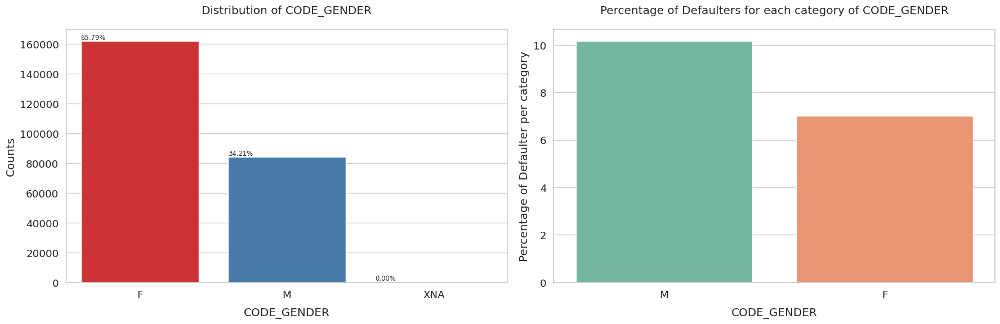

In [25]:
plot_categorical_variables_bar(train, ["CODE_GENDER"])

In [26]:
train_unique["CODE_GENDER"]

{'counts': {'F': 161856, 'M': 84150, 'XNA': 3},
 'percentages': {'F': 65.793, 'M': 34.206, 'XNA': 0.001}}

#### OCCUPATION_TYPE	

this feature has the highest correlation score with TARGET among categorical features
1. **High Application Rate of Laborers**: The largest share of applicants comes from laborers (26.17%), which suggests that this group is more likely to seek loans compared to others. This group represents a significant portion of the target audience for loan products.

2. **Defaulter Concentration in Low-Skill Laborers**: Although low-skill laborers make up only 0.98% of applicants, they exhibit the highest default rate. This suggests that this group carries a higher financial risk, potentially due to unstable income or job security. 

3. **Risk in Service Industry Jobs**: Positions like waiters, barmen, and drivers also show a relatively high default rate. Despite being more common than low-skill laborers in the dataset, these occupations may also face financial instability or lower earning potential, leading to higher default rates.

**Actionable Insight**: Financial institutions may want to consider additional risk assessment measures for low-skill laborers and certain service industry jobs when offering loans. Tailored products or higher scrutiny for these groups could mitigate the higher default risk.

/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Total Number of unique categories of OCCUPATION_TYPE = 19


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




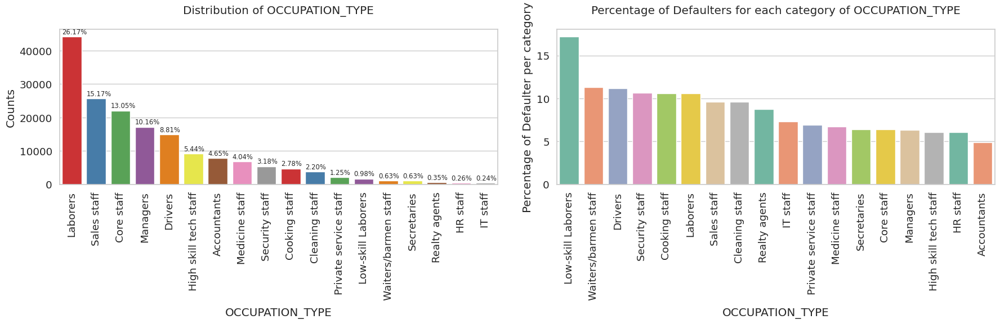

In [27]:
plot_categorical_variables_bar(train, ["OCCUPATION_TYPE"], rotation = 90)

#### ORGANIZATION_TYPE


1.  'Business Entity Type 3', 'XNA', and 'Self Employed' categories, implying that most applicants are from private businesses or undefined sectors.

2. Applicants working in the 'Transport: type 3' sector exhibit the highest default rates. This could suggest that the transport industry faces more financial instability, potentially due to factors like fuel price fluctuations, economic cycles, and operational costs, leading to a higher risk of default.n be affected by economic cycles, fuel prices, or demand fluctuations.

3. **Low Default Rates in Trade and Some Industry Types**: On the other hand, organizations in sectors like 'Trade: type 4' and 'Industry: type 12' exhibit lower default rates, suggesting these sectors may be more stable or less affected by economic shifts.

**Actionable Insight**: Lenders might consider adjusting risk models to account for higher default risks in specific industries like transport, construction, and certain types of manufacturing. Providing tailored loan products with different terms based on industry type could help mitigate risk.

Total Number of categories of ORGANIZATION_TYPE = 58


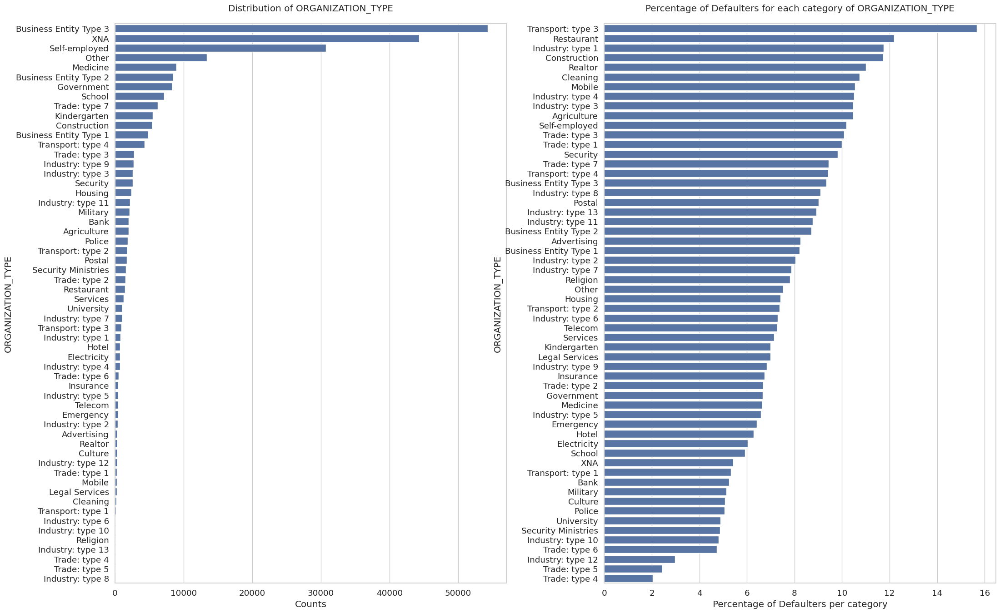

In [28]:
print(f"Total Number of categories of ORGANIZATION_TYPE = {len(train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = train.ORGANIZATION_TYPE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('ORGANIZATION_TYPE')

plt.subplot(1,2,2)
percentage_default_per_organization = train[train.TARGET == 1].ORGANIZATION_TYPE.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('ORGANIZATION_TYPE')

plt.show()

#### NAME_INCOME_TYPE

1. **Dominance of 'Working' Applicants**: The largest proportion of applicants come from the 'Working' category, indicating that most loan applicants are employed. This suggests a relatively stable base of applicants with regular income.

2. **High Default Rates in 'Maternity Leave'**: Despite 'Maternity Leave' applicants making up the smallest percentage of the total, they exhibit the highest default rates. This could be due to the temporary nature of their income during maternity leave, potentially leading to financial stress and higher default risk.

3. **Moderate Default Rates in 'Unemployed' and 'Pensioner'**: 'Unemployed' and 'Pensioner' categories follow with moderate default rates. While these groups may face financial challenges due to lack of stable income (in the case of unemployed individuals) or fixed income (in the case of pensioners), their default rates are still lower than those on maternity leave.

**Conclu**: Lenders may need to adjust their risk models based on employment status, particularly giving more weight to applicants on maternity leave due to their higher default risk despite the smaller applicant pool.

Total Number of unique categories of NAME_INCOME_TYPE = 8


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




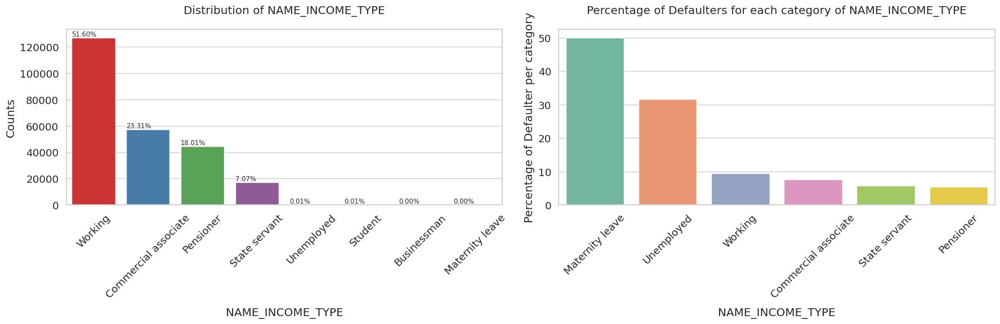

In [29]:
plot_categorical_variables_bar(train, ["NAME_INCOME_TYPE"], rotation= 45)

#### REG_CITY_NOT_WORK_CITY, FLAG_EMP_PHONE,FLAG_DOCUMENT_3,REG_CITY_NOT_LIVE_CITY,LIVE_CITY_NOT_WORK_CITY

Total Number of unique categories of REG_CITY_NOT_WORK_CITY = 2


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




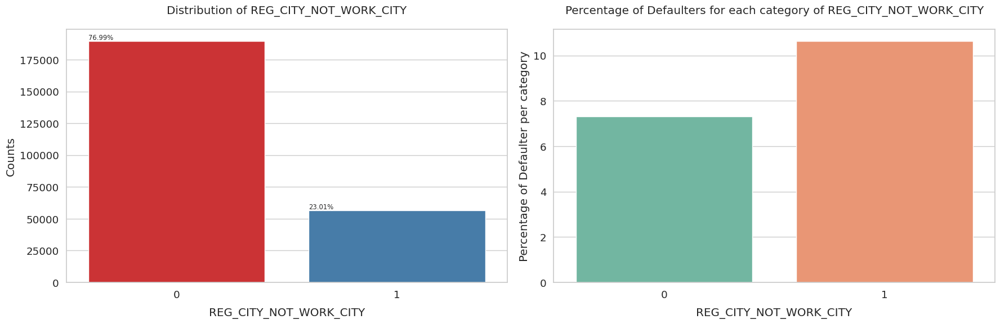

Total Number of unique categories of FLAG_EMP_PHONE = 2


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




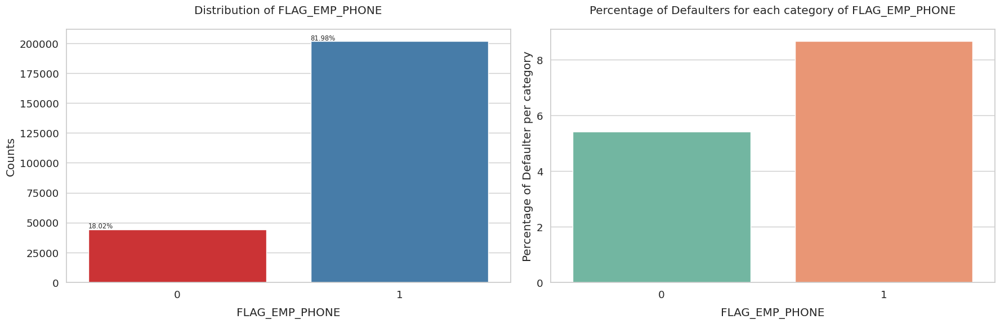

Total Number of unique categories of FLAG_DOCUMENT_3 = 2


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




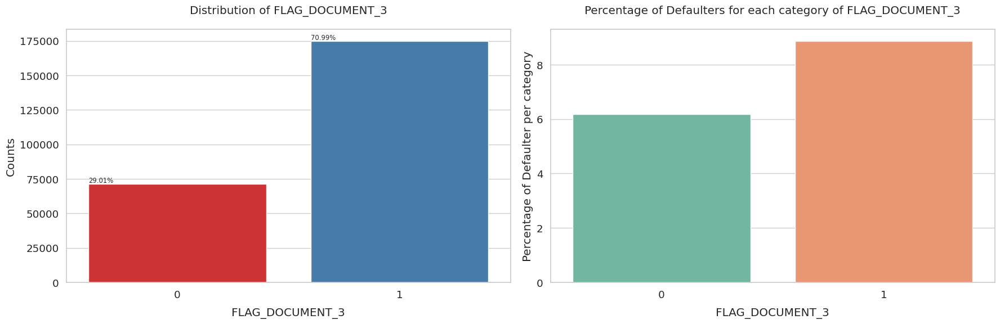

Total Number of unique categories of REG_CITY_NOT_LIVE_CITY = 2


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




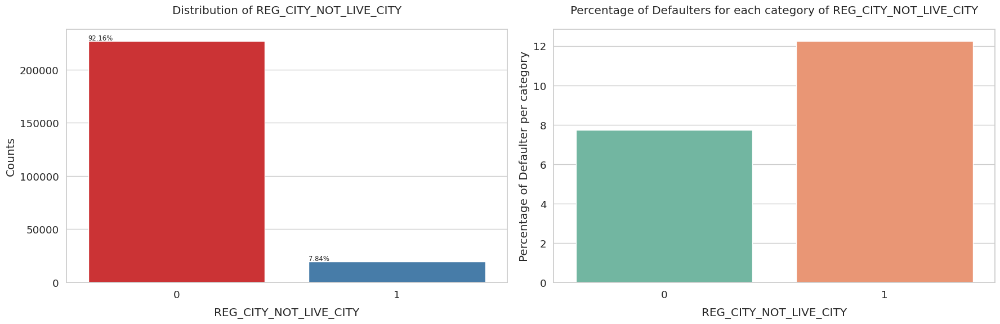

/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Total Number of unique categories of LIVE_CITY_NOT_WORK_CITY = 2


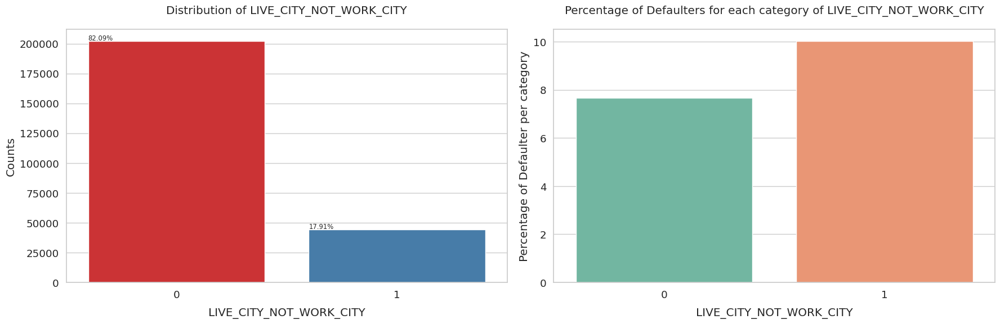

In [30]:
plot_categorical_variables_bar(train, ["REG_CITY_NOT_WORK_CITY", "FLAG_EMP_PHONE","FLAG_DOCUMENT_3","REG_CITY_NOT_LIVE_CITY","LIVE_CITY_NOT_WORK_CITY"])

1. **Address Mismatch Patterns**:  
   - Some applicants have different permanent and contact addresses, particularly at the regional level, indicating they may live or work in different areas.  
   - More applicants have mismatched permanent and work addresses, likely due to commuting or relocation.  
   - A smaller group has different permanent and contact addresses at the city level.

2. **Default Risk and Address Mismatch**:  
   - Applicants with address discrepancies, especially at the regional level, show higher default rates.  
   - In general, mismatched addresses suggest a higher default risk, potentially indicating financial instability or difficulty in tracking individuals.

3. **Document Submission and Default Risk**:  
   - A significant portion of applicants did not provide the required document, while those who did tend to have higher default rates.  
   - This suggests that applicants who submit certain documents may be more likely to default, potentially due to financial struggles or other risk factors.

#### NAME_FAMILY_STATUS

1. **Family Status Distribution**: imbalance 
   - The majority of applicants are **married** (around 64%), followed by **single/not married**, and **civil marriage** which are more evenly distributed (10-15%). The **separated** and **widowed** categories each make up about 5-6% of applicants.
   - There is one **unknown** category which does not have any defaulters and can likely be dropped from the analysis.

2. **Default Rates**: balance  
   - The **civil marriage** and **single/not married** groups have the highest default rates, suggesting that individuals in these categories may have higher financial risk or instability.
   - **Married** and **widowed** individuals have a relatively balanced default rate, between 6-10%, indicating that family status does not have as strong of an impact on default risk for these groups.
   
**Conclu**: The default risk is notably higher for applicants who are either single or in a civil marriage, while married and widowed individuals tend to exhibit more balanced or lower default rates.

Total Number of unique categories of NAME_FAMILY_STATUS = 6


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




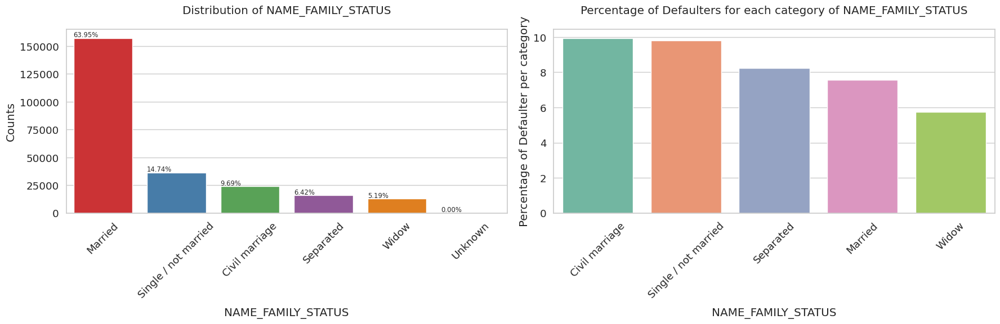

In [31]:
plot_categorical_variables_bar(train, ["NAME_FAMILY_STATUS"], rotation = 45)

In [32]:
train_unique["NAME_FAMILY_STATUS"]

{'counts': {'Married': 157320,
  'Single / not married': 36271,
  'Civil marriage': 23842,
  'Separated': 15805,
  'Widow': 12770,
  'Unknown': 1},
 'percentages': {'Married': 63.949,
  'Single / not married': 14.744,
  'Civil marriage': 9.692,
  'Separated': 6.425,
  'Widow': 5.191,
  'Unknown': 0.0}}

#### NAME_EDUCATION_TYPE

1. **Education Level Distribution**:  
   - The majority of applicants have a **secondary/secondary special** education, making up over 70% of the applicants, followed by those with **higher education** (24.4%). 
   - Categories like **incomplete higher education**, **lower secondary**, and **academic degree** have very low application rates, each below 5%.

2. **Default Rates by Education Level**:  
   - Despite having a very low application rate, individuals with **lower secondary** education have the highest default rate (over 10%). This could suggest that applicants with lower secondary education may face higher financial instability or challenges.
   - On the other hand, those with an **academic degree** have the lowest default rate (over 2%), indicating that higher education correlates with lower financial risk.

**Conclut**: While the majority of applicants have secondary-level education, those with **lower secondary** education exhibit the highest likelihood of default, whereas individuals with **higher education** (especially academic degrees) tend to have a much lower default rate, indicating a protective effect of higher education on financial stability.

Total Number of unique categories of NAME_EDUCATION_TYPE = 5


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




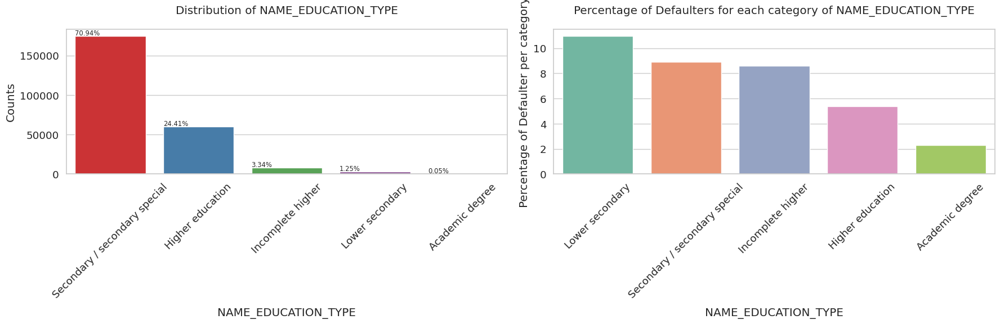

In [33]:
plot_categorical_variables_bar(train, ["NAME_EDUCATION_TYPE"], rotation = 45)

#### NAME_HOUSING_TYPE

1. **Most Common Housing Type**:  
   - The **house/department** category represents the largest group of applicants, and it also has the highest overall default rate (85.89%).

2. **High Default Rates in Smaller Categories**:  
   - Among the smaller housing categories, **rented apartments** show the highest default rate, even though they represent only a small fraction of the data (1.59%). This indicates that renters may face higher financial risks.
   - **Co-op apartments**, while being the least common housing type, also display a high default rate (8.16%), ranking third in terms of default tendency. This suggests that co-op living arrangements could be associated with financial instability.
  
3. **Living with Parents**:  
   - The **with parent** category shows a high default rate, which might imply that individuals living with parents may be more likely to default, possibly due to lower financial independence or reliance on family support.

**Conclu**: While most applicants live in houses or apartments, the **rented apartment** and **co-op apartment** categories, despite their smaller sizes, exhibit disproportionately high default rates. This suggests that these housing types may be linked to higher financial instability, while living with parents also shows notable default tendencies.

Total Number of unique categories of NAME_HOUSING_TYPE = 6


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




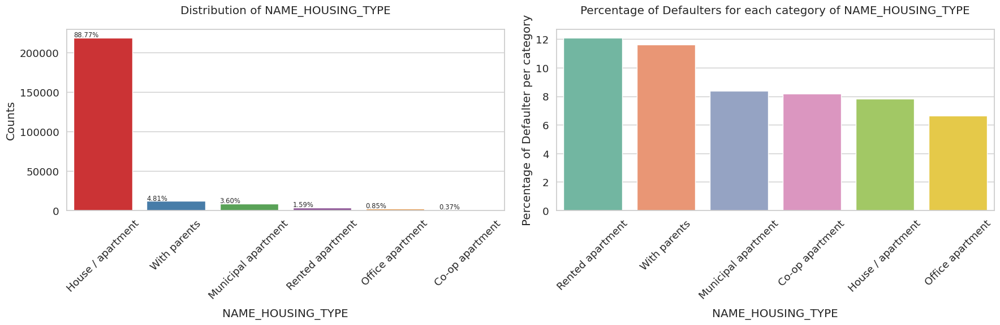

In [34]:
plot_categorical_variables_bar(train, ["NAME_HOUSING_TYPE"], rotation = 45)

####  EXT_SOURCE

1. **Lower EXT_SOURCE Values for Defaulters**:  
   - Defaulters consistently have lower values across all three EXT_SOURCE columns (EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3). This indicates that these features are strongly associated with the likelihood of defaulting, with lower EXT_SOURCE scores being indicative of higher default risk.

2. **Higher EXT_SOURCE Values for Non-Defaulters**:  
   - Non-defaulters, on the other hand, show higher peaks at higher EXT_SOURCE values, suggesting a positive correlation between higher EXT_SOURCE scores and financial reliability. This implies that individuals with better creditworthiness or financial stability tend to have higher EXT_SOURCE scores.

3. **Separation Between Defaulters and Non-Defaulters**:  
   - The **EXT_SOURCE_1** and **EXT_SOURCE_3** columns show clearer separability between defaulters and non-defaulters, making them more useful for distinguishing between the two groups compared to EXT_SOURCE_2. This can make them valuable features for credit risk modeling.

4. **Median Comparison**:  
   - The median value for defaulters is lower or almost equal to the 25th percentile value for non-defaulters, highlighting that defaulters typically fall into a lower range of EXT_SOURCE values, further emphasizing the utility of these features for predicting default risk.

**Conclu**: The EXT_SOURCE columns, especially **EXT_SOURCE_1** and **EXT_SOURCE_3**, show strong discrimination between defaulters and non-defaulters, with lower EXT_SOURCE values being highly indicative of default risk. These features can be critical for improving default prediction models.

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




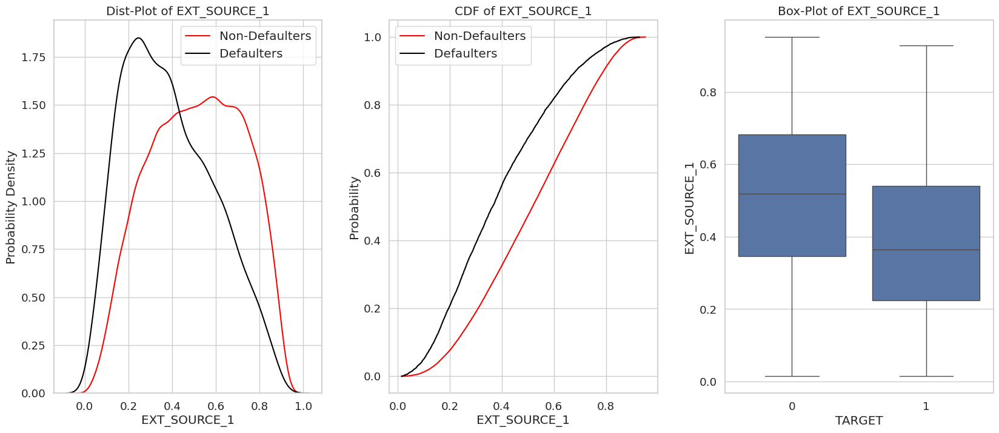

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




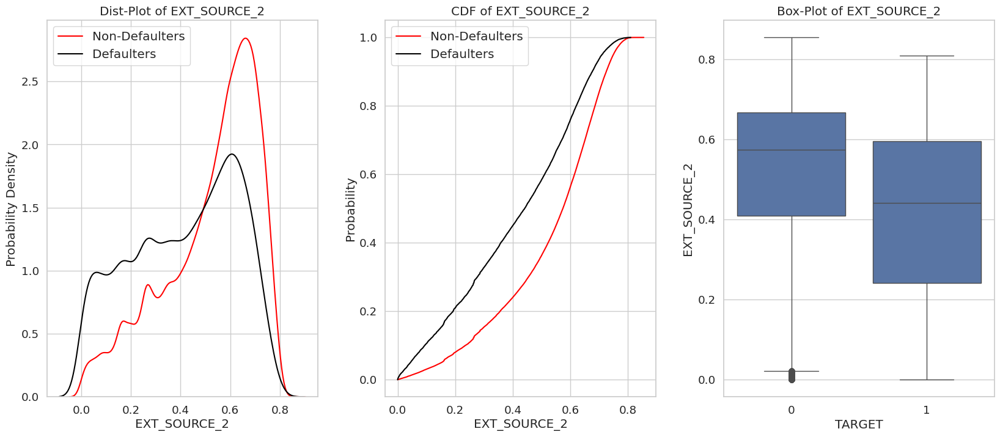

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




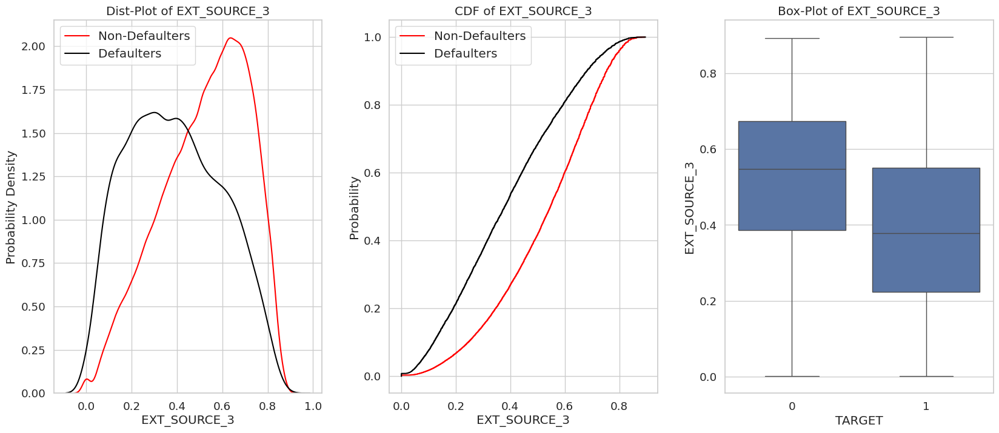

In [35]:
plot_continuous_variables(train, ["EXT_SOURCE_1","EXT_SOURCE_2","EXT_SOURCE_3"])

#### DAYS_BIRTH

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




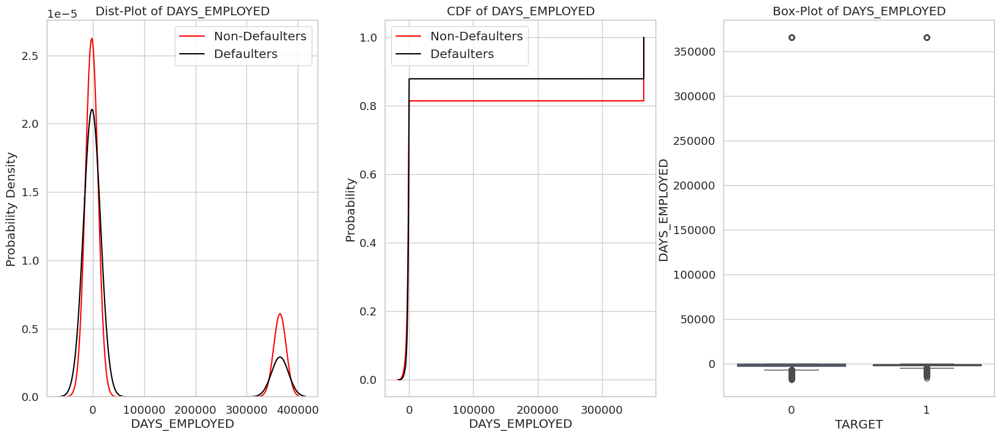

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




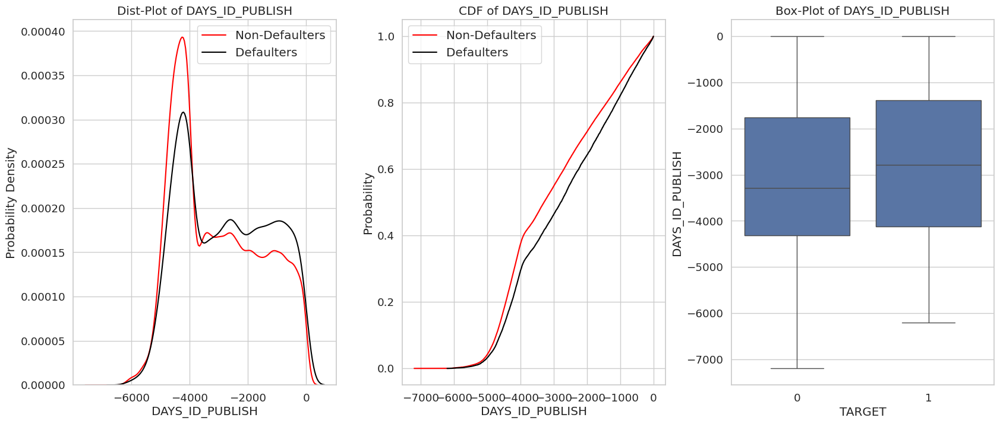

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




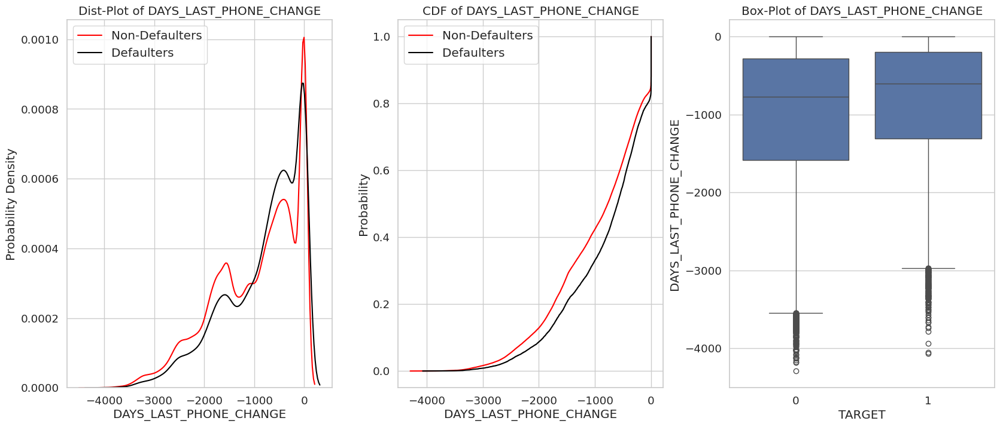

In [36]:
plot_continuous_variables(train, ['DAYS_EMPLOYED', 'DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE'])

days_employed có đúng 1 giá trị >0 là 365243 -> error

In [37]:
# len(train["NAME_INCOME_TYPE"][train["NAME_INCOME_TYPE"]=="Pensioner"])

In [38]:
# continuous_column(train, "AMT_REQ_CREDIT_BUREAU_YEAR")

In [39]:
# print(f'duplicate values in application_train: {df.shape[0] - df.duplicated().shape[0]}')
# print("unique prev id", len(df["SK_ID_PREV"].unique()))
# print ("uniique curr id", len(df["SK_ID_CURR"].unique()))

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




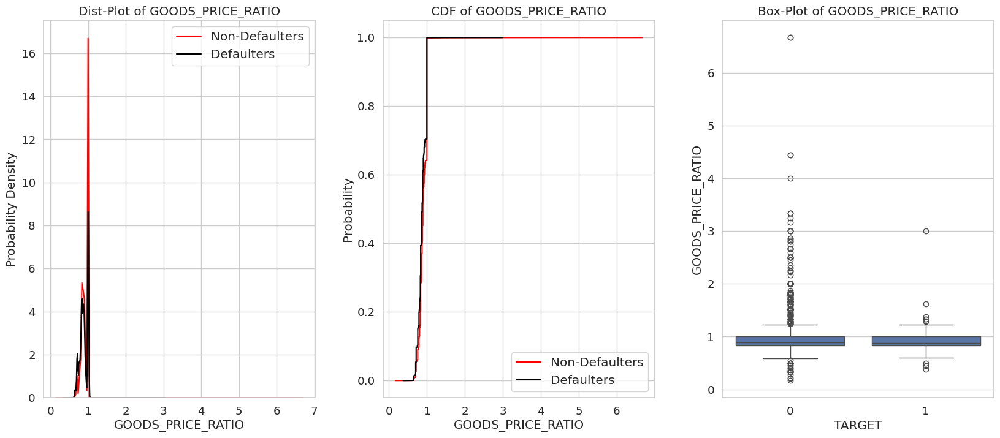

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




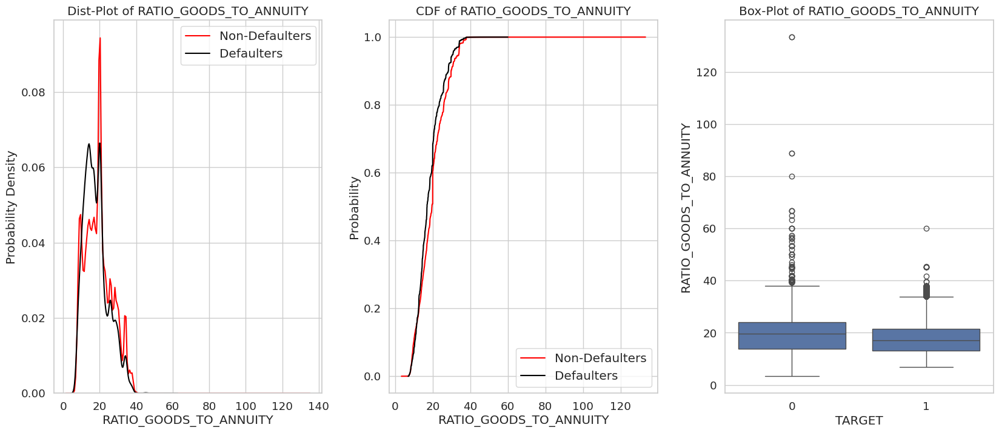

In [40]:
plot_continuous_variables(train, ["GOODS_PRICE_RATIO","RATIO_GOODS_TO_ANNUITY"])

#### RATIO_GOODS_TO_ANNUITY, GOODS_PRICE_RATIO

1. **GOODS_PRICE_RATIO**:
   - **Insight**: A higher **goods_price_ratio** (greater than 20) indicates a lower likelihood of default. This means that the value of the goods being financed is significantly higher than the loan amount, implying the borrower has substantial collateral, reducing the financial risk.
   - **Explanation**: This ratio compares the price of the goods purchased with the loan amount. If the value of the goods is much higher than the loan, it suggests that the borrower is not stretching their finances to the limit, reducing the risk of default. A ratio less than 20 implies the opposite, signaling that the borrower may be over-leveraged.

2. **RATIO_GOODS_TO_ANNUITY**:
   - **Insight**: A lower **ratio_goods_to_annuity** is associated with a higher likelihood of default. When this ratio is low, it suggests the borrower is paying a higher proportion of their loan as regular installments, potentially making it more difficult for them to meet financial obligations.
   - **Explanation**: This ratio compares the value of the financed goods to the monthly annuity (installment payment). A high ratio means that the monthly payments are relatively small compared to the value of the goods, making the loan more affordable. On the other hand, a low ratio indicates the borrower is committing a large portion of their income to loan repayment, which may lead to financial strain and increase the likelihood of default.

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




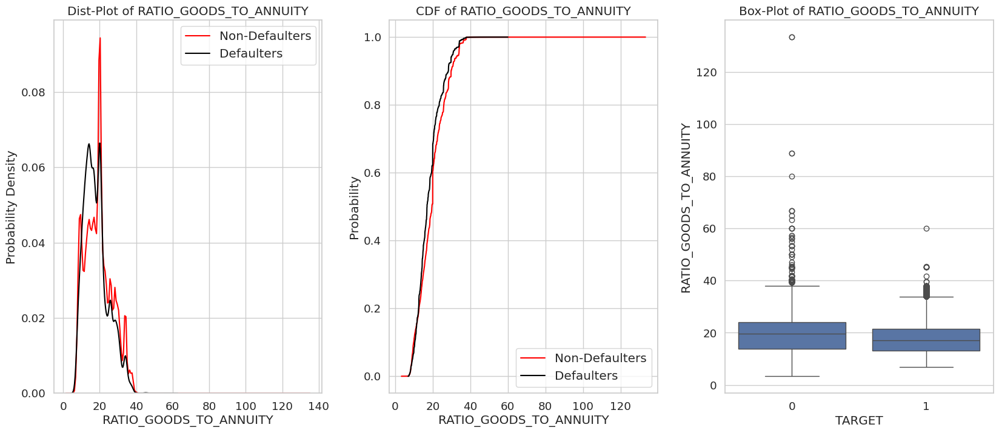

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




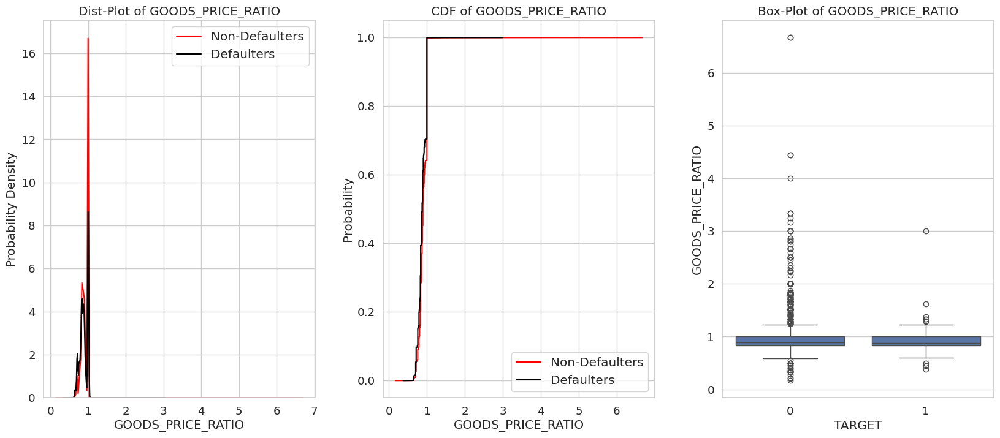

In [41]:
plot_continuous_variables(train, ["RATIO_GOODS_TO_ANNUITY","GOODS_PRICE_RATIO" ])

## PREV

#### Overall insights

1. **Contract Type and Loan Status**:
   - **Consumer Loans** have the highest approval rate, but they also carry a **high default rate**, indicating that while they are frequently approved, they attract a higher risk of default.
   - **Cash Loans**, despite having a high rejection and cancellation rate, show the **highest default rate**. This suggests that applicants seeking cash loans are more likely to default, possibly due to the nature of cash loan products which may attract financially unstable applicants.
   - **'XNA' Values** represent missing or unclear data, but these have the **highest default rate**. This indicates that missing or incomplete data is often linked to higher financial risk.

2. **Approval and Default Rates**:
   - **Rejected or Canceled Applications**: Loans that were **canceled, refused**, or had **unused offers** have **lower approval rates**, but a significantly **higher default rate**. This points to the idea that applicants whose loans are rejected or canceled may still pose a high risk in the future if they are reapplying.

3. **Applicant Behavior and Financial Stability**:
   - Applicants with **previous loan applications** (indicated by `SK_ID_PREV`) who were rejected or canceled in their prior attempts are more likely to default. This suggests that applicants who are repeatedly rejected or whose previous loans were canceled may have higher financial instability, making them more prone to default.
   - **Low-Skill Laborers**, those with **lower secondary education**, or those living in uncertain or non-standard housing situations tend to have higher default rates. These factors suggest lower financial stability and may indicate applicants who are at higher risk.

4. **Unclear or Incomplete Data**:
   - **Missing or ambiguous data** (like 'XNA' in columns) are often linked to **higher default rates**, highlighting the importance of complete and accurate data for accurate risk prediction.

### Key Conclusion:
Applicants with **previously rejected or canceled loans**, those applying for **cash loans**, or those with missing/ambiguous data are **more likely to default**. These factors, along with specific socioeconomic indicators like **lower education** or **non-standard living conditions**, can help in identifying high-risk applicants for default.

#### basis stat

In [42]:
prev.describe()

,SK_ID_PREV,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,SK_ID_CURR
count,1.413701e+06,1.106483e+06,1.413701e+06,1.413700e+06,6.641610e+05,1.094176e+06,1.413701e+06,1.413701e+06,664161.000000,4791.000000,4791.000000,1.413701e+06,1.413701e+06,1.106488e+06,852595.000000,852595.000000,852595.000000,852595.000000,852595.000000,852595.000000,1.413701e+06
mean,1.922744e+06,1.583718e+04,1.752436e+05,1.963541e+05,6.655317e+03,2.264512e+05,1.247893e+01,9.964321e-01,0.080175,0.189436,0.771284,-8.803670e+02,3.149878e+02,1.605194e+01,342257.656710,13488.741567,33274.831806,76665.634755,82353.171672,0.330572,1.537647e+05
std,5.327153e+05,1.472491e+04,2.936222e+05,3.194813e+05,2.062030e+04,3.159376e+05,3.331474e+00,5.962560e-02,0.107784,0.090849,0.100644,7.835402e+02,7.695082e+03,1.456675e+01,88832.266598,71650.147146,106161.775933,149704.716371,153537.064274,0.470419,8.867392e+04
min,1.000001e+06,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000,0.000000e+00
25%,1.461346e+06,6.257858e+03,1.975050e+04,2.488050e+04,0.000000e+00,4.982850e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.313000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1630.000000,-1244.000000,-1316.000000,-1269.000000,0.000000,7.692000e+04
50%,1.922698e+06,1.122376e+04,7.087050e+04,8.059500e+04,1.791000e+03,1.102455e+05,1.200000e+01,1.000000e+00,0.062489,0.189136,0.835095,-5.820000e+02,4.000000e+00,1.200000e+01,365243.000000,-825.000000,-358.000000,-534.000000,-494.000000,0.000000,1.536860e+05
75%,2.384012e+06,2.042078e+04,1.800000e+05,2.156400e+05,7.695000e+03,2.295000e+05,1.500000e+01,1.000000e+00,0.108912,0.193330,0.852537,-2.710000e+02,8.500000e+01,2.400000e+01,365243.000000,-408.000000,135.000000,-73.000000,-42.000000,1.000000,2.305300e+05
max,2.845381e+06,4.180581e+05,5.850000e+06,4.509688e+06,3.060045e+06,5.850000e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000,3.075100e+05


In [43]:
prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1413701 entries, 0 to 1413700
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1413701 non-null  int64  
 1   NAME_CONTRACT_TYPE           1413701 non-null  object 
 2   AMT_ANNUITY                  1106483 non-null  float64
 3   AMT_APPLICATION              1413701 non-null  float64
 4   AMT_CREDIT                   1413700 non-null  float64
 5   AMT_DOWN_PAYMENT             664161 non-null   float64
 6   AMT_GOODS_PRICE              1094176 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1413701 non-null  object 
 8   HOUR_APPR_PROCESS_START      1413701 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1413701 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1413701 non-null  int64  
 11  RATE_DOWN_PAYMENT            664161 non-null   float64
 12  RATE_INTEREST_PRIMARY        4791 non-null

In [44]:
print(f'Number of overlapping SK_ID_CURR in application_train.csv and previous_application.csv are: {len(set(train.SK_ID_CURR.unique()).intersection(set(prev.SK_ID_CURR.unique())))}')

Number of overlapping SK_ID_CURR in application_train.csv and previous_application.csv are: 232826


In [45]:
print ("duplicate",prev.shape[0] - prev.duplicated().shape[0])

duplicate 0


In [46]:
prev_merged = train[['SK_ID_CURR', 'TARGET']].merge(prev, on='SK_ID_CURR', how='left')
prev_merged.head()

,SK_ID_CURR,TARGET,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,278621,0,1810518.0,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12.0,Y,1.0,NaN,NaN,NaN,XNA,Approved,-746.0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
1,278621,0,2636178.0,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17.0,Y,1.0,0.000000,NaN,NaN,XAP,Approved,-828.0,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400.0,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
2,278621,0,2396755.0,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,SATURDAY,15.0,Y,1.0,0.100061,NaN,NaN,XAP,Approved,-2341.0,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200.0,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
3,139008,0,2078043.0,Cash loans,24246.000,675000.0,675000.0,NaN,675000.0,THURSDAY,15.0,Y,1.0,NaN,NaN,NaN,XNA,Approved,-181.0,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,48.0,low_normal,Cash X-Sell: low,365243.0,-151.0,1259.0,-151.0,-143.0,0.0
4,139008,0,2827850.0,Revolving loans,NaN,0.0,0.0,NaN,NaN,THURSDAY,15.0,Y,1.0,NaN,NaN,NaN,XAP,Canceled,-181.0,XNA,XAP,NaN,Repeater,XNA,XNA,XNA,Credit and cash offices,-1.0,XNA,NaN,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
prev_merged['DATE_DIFF'] = prev_merged['DAYS_TERMINATION'] - prev_merged['DAYS_LAST_DUE']
prev_merged['ACTIVE'] = prev_merged['DAYS_LAST_DUE'] > 0
prev_merged['ACTUAL_DURATION'] = prev_merged['DAYS_LAST_DUE'] - prev_merged['DAYS_FIRST_DUE']
prev_merged['DURATION'] = prev_merged['DAYS_TERMINATION'] - prev_merged['DAYS_FIRST_DUE']
prev_merged['LIFETIME_LOAN'] = prev_merged['DAYS_TERMINATION'] > 16000

prev_merged['FINISH_RATE'] = (prev_merged['ACTUAL_DURATION'] / prev_merged['DURATION']) * (1 - prev_merged['ACTIVE']) * (1 - prev_merged['LIFETIME_LOAN'])
#New features from old features

#Ratio: value ask / value received percentage 
prev_merge = prev_merged.drop(prev_merged[prev_merged['AMT_CREDIT'].isnull() == True].index) 
prev_merged['APP_CREDIT_PERC'] = prev_merged['AMT_APPLICATION'] / prev_merged['AMT_CREDIT'] * (prev_merged['AMT_CREDIT'] != 0)



prev_merged['ANNUITY_PAYMENT_PRODUCT'] = prev_merged['AMT_ANNUITY'] * prev_merged['CNT_PAYMENT']
prev_merged['HIGH_DOWN_PAYMENT'] = (prev_merged['AMT_DOWN_PAYMENT'] > 10000)

prev_merged['CREDIT_DOWNPAYMENT'] = prev_merged['AMT_GOODS_PRICE'] - prev_merged['AMT_DOWN_PAYMENT']

prev_merged['CREDIT_ANNUITY_RATIO'] = prev_merged['AMT_CREDIT'] / prev_merged['AMT_ANNUITY'] * (prev_merged['AMT_ANNUITY'] != 0)
prev_merged['RATIO_APPLICATION_TO_ANNUITY'] =  prev_merged['AMT_APPLICATION'] / prev_merged['AMT_ANNUITY'] * (prev_merged['AMT_ANNUITY'] != 0)
prev_merged['RATIO_GOODS_TO_ANNUITY'] =  prev_merged['AMT_GOODS_PRICE'] / prev_merged['AMT_ANNUITY'] * (prev_merged['AMT_ANNUITY'] != 0)


#Churn_prev: Whether the payment date is late 
# 1= delayed, 0 = not delayed, NaN = null
k = prev_merged.DAYS_LAST_DUE_1ST_VERSION - prev_merged.DAYS_LAST_DUE
prev_merged["CHURN_PREV"] = [1 if i >= 0 else (0 if i < 0  else "NaN") for i in k]

prev_merged['AMT_DIFF_PERCENT'] = ((prev_merged['AMT_CREDIT'] - prev_merged['AMT_APPLICATION']) / prev_merged['AMT_APPLICATION']) * 100
prev_merged['ADJUSTMENT_DIRECTION'] = (prev_merged['AMT_CREDIT'] - prev_merged['AMT_APPLICATION']) >= 0
prev_merged['ADJUSTMENT_DIRECTION'] = prev_merged['ADJUSTMENT_DIRECTION'].map({'True': 1, 'False': 0}) #whether final credit amount is equal clients' application 

#Interest rate
prev_merged['INTEREST'] = prev_merged['CNT_PAYMENT']*prev_merged['AMT_ANNUITY'] - prev_merged['AMT_CREDIT']
prev_merged['INTEREST_RATE'] = 2*12*prev_merged['INTEREST']/(prev_merged['AMT_CREDIT']*(prev_merged['CNT_PAYMENT']+1))
prev_merged['INTEREST_SHARE'] = prev_merged['INTEREST']/prev_merged['AMT_CREDIT']


prev_merged["DAYS_DECISION"] = [1 if abs(i/(12*30)) <=1 else 0 for i in prev_merged.DAYS_DECISION]

#Separate weekend from weekdays
prev_merged["WEEKDAY_APPR_PROCESS_START"] = prev_merged["WEEKDAY_APPR_PROCESS_START"].replace(['MONDAY','TUESDAY', 'WEDNESDAY','THURSDAY','FRIDAY'], 'WEEK_DAY')
prev_merged["WEEKDAY_APPR_PROCESS_START"] = prev_merged["WEEKDAY_APPR_PROCESS_START"].replace(['SATURDAY', 'SUNDAY'], 'WEEKEND')
prev_merged["WEEKDAY_APPR_PROCESS_START"].fillna('WEEK_DAY', inplace=True)

#Separate working hours from off_hours
prev_merged["HOUR_APPR_PROCESS_START"] = prev_merged["HOUR_APPR_PROCESS_START"].replace([8,9,10,11,12,13,14,15,16,17], 'working_hours')
prev_merged["HOUR_APPR_PROCESS_START"] = prev_merged["HOUR_APPR_PROCESS_START"].replace([18,19,20,21,22,23,0,1,2,3,4,5,6,7], 'off_hours')


#dpg feat
#ti le giua so tien yeu cau va so tien duoc cap 
prev_merged['APP_TO_CREDIT_RATIO'] = prev_merged['AMT_APPLICATION'] / prev_merged['AMT_CREDIT']

#ti le giua cọc va so tien vayy 
prev_merged['DOWN_PAYMENT_RATIO'] = prev_merged['AMT_DOWN_PAYMENT'] / prev_merged['AMT_CREDIT']

#ti le gia tri goods va so tien vay 
prev_merged['GOODS_PRICE_RATIO'] = prev_merged['AMT_GOODS_PRICE'] / prev_merged['AMT_CREDIT']

#neu don xin vay vao cuoi tuan
prev_merged['WEEKDAY_ACTIVE'] = prev_merged['WEEKDAY_APPR_PROCESS_START'].isin(["WEEKEND"])

#flag if kassr appl
prev_merged['LAST_APPL_PER_CONTRACT_FLAG'] = prev_merged['FLAG_LAST_APPL_PER_CONTRACT']
prev_merged['DOWN_PAYMENT_TO_GOODS_RATIO'] = prev_merged['AMT_DOWN_PAYMENT'] / prev_merged['AMT_GOODS_PRICE']
prev_merged['DURATION_TO_FINISH_RATE_RATIO'] = prev_merged['DURATION'] * prev_merged['FINISH_RATE']

#ti le giua thoi gian thuc te va su chenh lech giua ngay dao han cuoi cung
prev_merged['ACTUAL_DURATION_TO_DAYS_DIFF_RATIO'] = prev_merged['ACTUAL_DURATION'] / prev_merged['DATE_DIFF']
prev_merged['MAX_CREDIT_REQUEST'] = prev_merged.groupby('SK_ID_PREV')['AMT_APPLICATION'].transform('max')
prev_merged['AVERAGE_CREDIT_REQUEST'] = prev_merged.groupby('SK_ID_PREV')['AMT_APPLICATION'].transform('mean')

#flag khong hoan thanh (chua ket thuc theo thoi gian haoc chua tra het)
prev_merged['INCOMPLETE_LOAN_FLAG'] = (prev_merged['ACTIVE'] == True) & (prev_merged['LIFETIME_LOAN'] == False)

#thoi gian trung binh cac khoan vay
prev_merged['AVERAGE_LOAN_DURATION'] = prev_merged.groupby('SK_ID_PREV')['ACTUAL_DURATION'].transform('mean')

#thoi gian vay dai nhat
prev_merged['MAX_LOAN_DURATION'] = prev_merged.groupby('SK_ID_PREV')['ACTUAL_DURATION'].transform('max')

/tmp/ipykernel_2261849/1630967301.py:46: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [48]:
prev.columns[prev.notna().all()].tolist()

['SK_ID_PREV',
 'NAME_CONTRACT_TYPE',
 'AMT_APPLICATION',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NFLAG_LAST_APPL_IN_DAY',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'DAYS_DECISION',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'SELLERPLACE_AREA',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'SK_ID_CURR']

In [49]:
prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1413701 entries, 0 to 1413700
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1413701 non-null  int64  
 1   NAME_CONTRACT_TYPE           1413701 non-null  object 
 2   AMT_ANNUITY                  1106483 non-null  float64
 3   AMT_APPLICATION              1413701 non-null  float64
 4   AMT_CREDIT                   1413700 non-null  float64
 5   AMT_DOWN_PAYMENT             664161 non-null   float64
 6   AMT_GOODS_PRICE              1094176 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1413701 non-null  object 
 8   HOUR_APPR_PROCESS_START      1413701 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1413701 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1413701 non-null  int64  
 11  RATE_DOWN_PAYMENT            664161 non-null   float64
 12  RATE_INTEREST_PRIMARY        4791 non-null

16


/tmp/ipykernel_2261849/2922345595.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




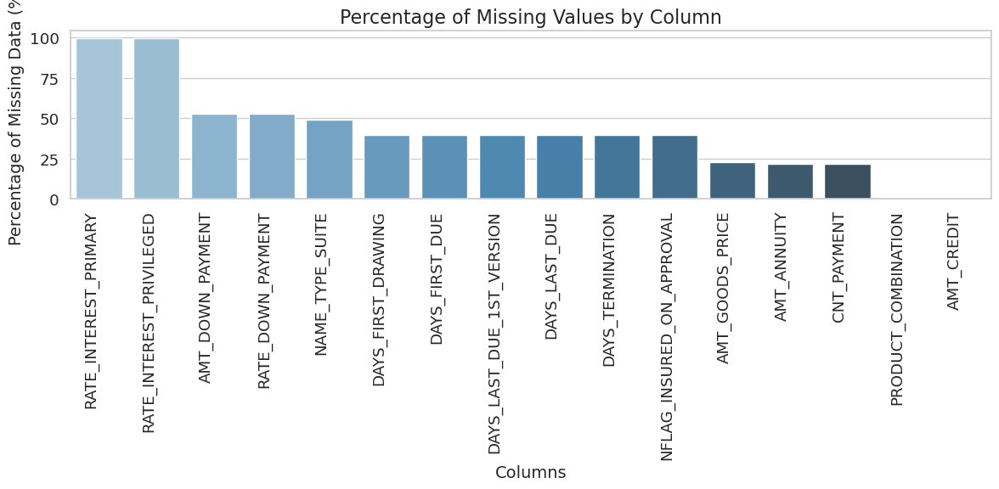

In [50]:
prev_merged["NFLAG_LAST_APPL_IN_DAY"] = prev_merged["NFLAG_LAST_APPL_IN_DAY"].map({1:'Y', 0:'N'})
prev_nan = visualize_missing_data(prev)
prev_unique = count_unique_values(prev_merged)

----------------------------------------------------------------------------------------------------


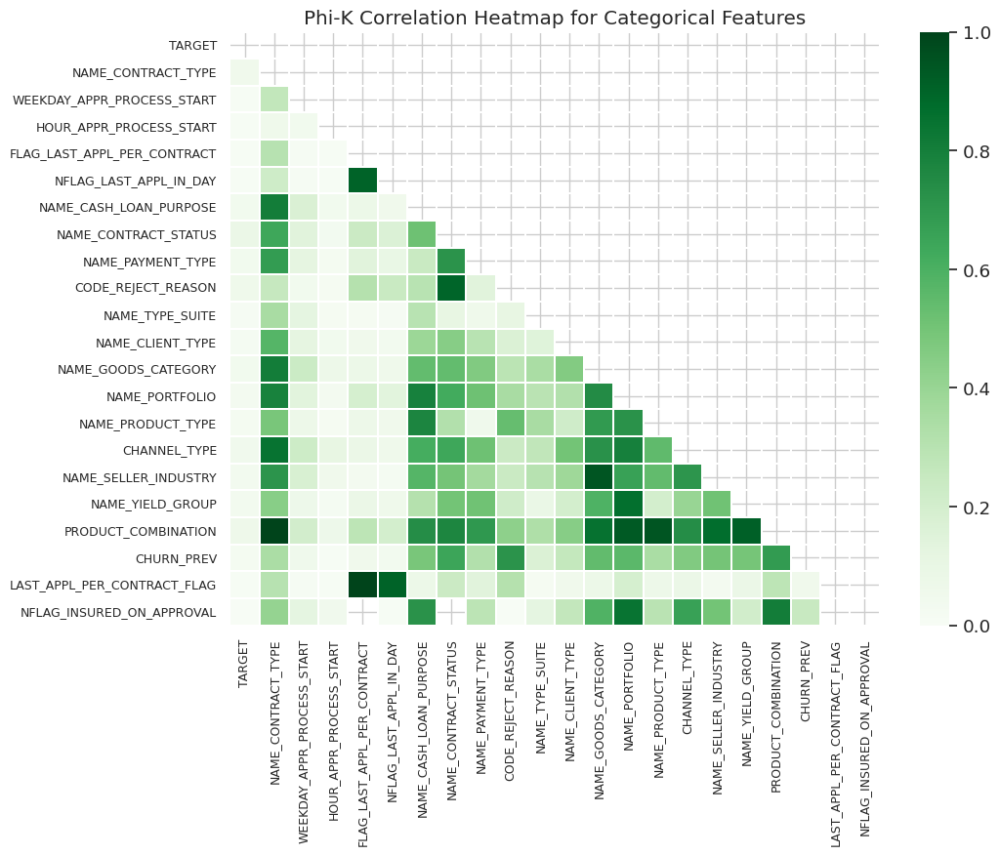

Categories with highest values of Phi-K Correlation value with Target Variable are:


,Column Name,Phik-Correlation
6,NAME_CONTRACT_STATUS,0.086879
17,PRODUCT_COMBINATION,0.064961
8,CODE_REJECT_REASON,0.061816
0,NAME_CONTRACT_TYPE,0.050952
14,CHANNEL_TYPE,0.049091
11,NAME_GOODS_CATEGORY,0.046869
5,NAME_CASH_LOAN_PURPOSE,0.040725
7,NAME_PAYMENT_TYPE,0.039151
15,NAME_SELLER_INDUSTRY,0.038537
16,NAME_YIELD_GROUP,0.035383


In [51]:
cols_for_phik = ['TARGET'] + prev_merged.dtypes[prev_merged.dtypes == 'object'].index.tolist() + ['NFLAG_INSURED_ON_APPROVAL']
plot_phik_matrix(prev_merged, cols_for_phik, cmap = 'Greens', figsize = (11,9), fontsize = 9)

In [52]:
prev_merged.head()

,SK_ID_CURR,TARGET,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,DATE_DIFF,ACTIVE,ACTUAL_DURATION,DURATION,LIFETIME_LOAN,FINISH_RATE,APP_CREDIT_PERC,ANNUITY_PAYMENT_PRODUCT,HIGH_DOWN_PAYMENT,CREDIT_DOWNPAYMENT,CREDIT_ANNUITY_RATIO,RATIO_APPLICATION_TO_ANNUITY,RATIO_GOODS_TO_ANNUITY,CHURN_PREV,AMT_DIFF_PERCENT,ADJUSTMENT_DIRECTION,INTEREST,INTEREST_RATE,INTEREST_SHARE,APP_TO_CREDIT_RATIO,DOWN_PAYMENT_RATIO,GOODS_PRICE_RATIO,WEEKDAY_ACTIVE,LAST_APPL_PER_CONTRACT_FLAG,DOWN_PAYMENT_TO_GOODS_RATIO,DURATION_TO_FINISH_RATE_RATIO,ACTUAL_DURATION_TO_DAYS_DIFF_RATIO,MAX_CREDIT_REQUEST,AVERAGE_CREDIT_REQUEST,INCOMPLETE_LOAN_FLAG,AVERAGE_LOAN_DURATION,MAX_LOAN_DURATION
0,278621,0,1810518.0,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,WEEK_DAY,working_hours,Y,Y,NaN,NaN,NaN,XNA,Approved,0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0,9.0,False,180.0,189.0,False,0.952381,0.868825,1180283.94,False,NaN,10.531859,9.150341,9.150341,1,15.098000,NaN,144401.94,0.257354,0.139400,0.868825,NaN,0.868825,False,Y,NaN,180.0,20.00,900000.0,900000.0,False,180.0,180.0
1,278621,0,2636178.0,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,WEEKEND,working_hours,Y,Y,0.000000,NaN,NaN,XAP,Approved,0,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400.0,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0,8.0,False,150.0,158.0,False,0.949367,0.968054,387405.99,False,337500.0,5.399568,5.227075,5.227075,1,3.300000,NaN,38768.49,0.381257,0.111200,0.968054,0.00000,0.968054,True,Y,0.000000,150.0,18.75,337500.0,337500.0,False,150.0,150.0
2,278621,0,2396755.0,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,WEEKEND,working_hours,Y,Y,0.100061,NaN,NaN,XAP,Approved,0,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200.0,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0,4.0,False,330.0,334.0,False,0.988024,1.011109,80847.72,False,61924.5,10.100990,10.213201,10.213201,1,-1.098686,NaN,12794.22,0.347081,0.188002,1.011109,0.10117,1.011109,True,Y,0.100059,330.0,82.50,68809.5,68809.5,False,330.0,330.0
3,139008,0,2078043.0,Cash loans,24246.000,675000.0,675000.0,NaN,675000.0,WEEK_DAY,working_hours,Y,Y,NaN,NaN,NaN,XNA,Approved,1,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,48.0,low_normal,Cash X-Sell: low,365243.0,-151.0,1259.0,-151.0,-143.0,0.0,8.0,False,0.0,8.0,False,0.000000,1.000000,1163808.00,False,NaN,27.839644,27.839644,27.839644,1,0.000000,NaN,488808.00,0.354691,0.724160,1.000000,NaN,1.000000,False,Y,NaN,0.0,0.00,675000.0,675000.0,False,0.0,0.0
4,139008,0,2827850.0,Revolving loans,NaN,0.0,0.0,NaN,NaN,WEEK_DAY,working_hours,Y,Y,NaN,NaN,NaN,XAP,Canceled,1,XNA,XAP,NaN,Repeater,XNA,XNA,XNA,Credit and cash offices,-1.0,XNA,NaN,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,Y,NaN,NaN,NaN,0.0,0.0,False,NaN,NaN


#### CONTRACT_STATUS

Despite having the highest approval rate (over 62%), consumer loans have the lowest default rate. In contrast, canceled, refused, and unused offers have lower approval rates but significantly higher default rates, indicating that rejected or canceled loans are more likely to lead to defaults.

Total Number of unique categories of NAME_CONTRACT_STATUS = 5


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




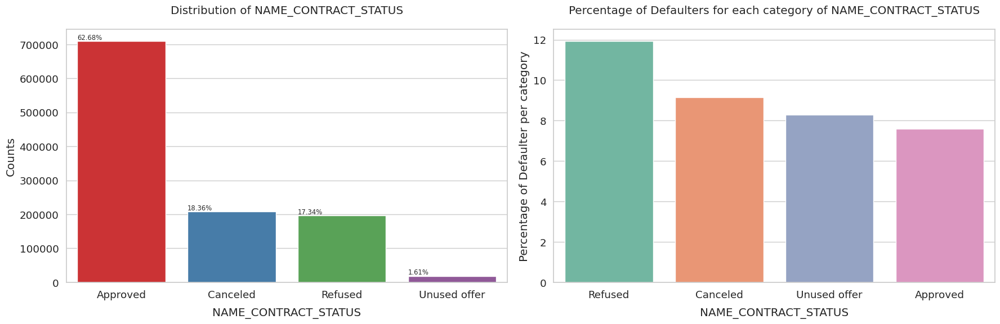

In [53]:
plot_categorical_variables_bar(prev_merged, ["NAME_CONTRACT_STATUS"])

#### NAME_CONTRACT_TYPE

1. **Consumer Loan**:
   - **Approval Rate**: Has the highest approval rate but also the **second-highest default rate**, indicating higher risk despite frequent approvals.

2. **'XNA' Values**:
   - Despite the low number of records, **'XNA'** has the **highest default rate**, suggesting that missing or unclear data is linked to higher risk.

3. **Cash Loan**:
   - **High Rejection & Cancellation**: Cash loans face more rejections and cancellations, but they also have the **highest default rate**, making them the most risky loan type.

In summary, **consumer loans** are approved more often but still pose significant risk, while **cash loans** have the highest default rates despite a higher rejection rate.

In [54]:
prev_unique["NAME_CONTRACT_STATUS"]

{'counts': {'Approved': 708850,
  'Canceled': 207652,
  'Refused': 196126,
  'Unused offer': 18263,
  nan: 13183},
 'percentages': {'Approved': 61.958,
  'Canceled': 18.15,
  'Refused': 17.143,
  'Unused offer': 1.596,
  nan: 1.152}}

/tmp/ipykernel_2261849/2758556838.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



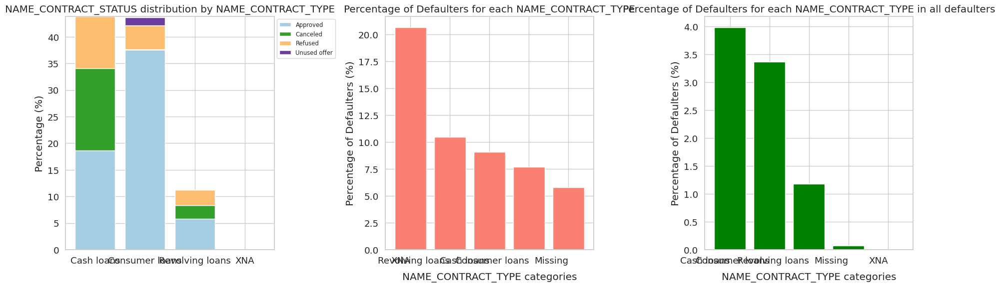

In [55]:
stack_plot_prev(prev_merged, ["NAME_CONTRACT_TYPE"], "NAME_CONTRACT_STATUS")

#### "AMT_ANNUITY","AMT_APPLICATION","AMT_CREDIT","AMT_DOWN_PAYMENT","AMT_GOODS_PRICE"

All null values for **AMT_ANNUITY**, **AMT_APPLICATION**, **AMT_CREDIT**, **AMT_DOWN_PAYMENT**, and **AMT_GOODS_PRICE** are associated with **refused** or **canceled** contracts. The distribution between the amounts and the likelihood of default vs non-default is relatively balanced, suggesting that missing values in these fields do not significantly impact the default rate.

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




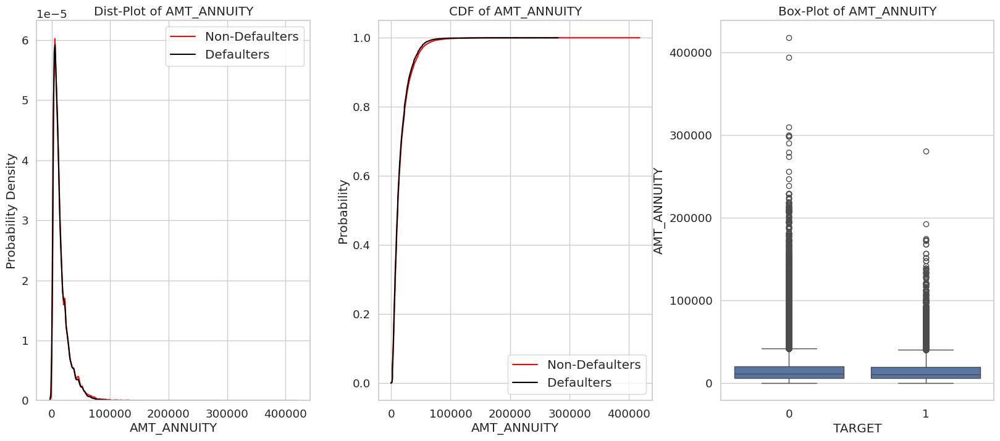

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




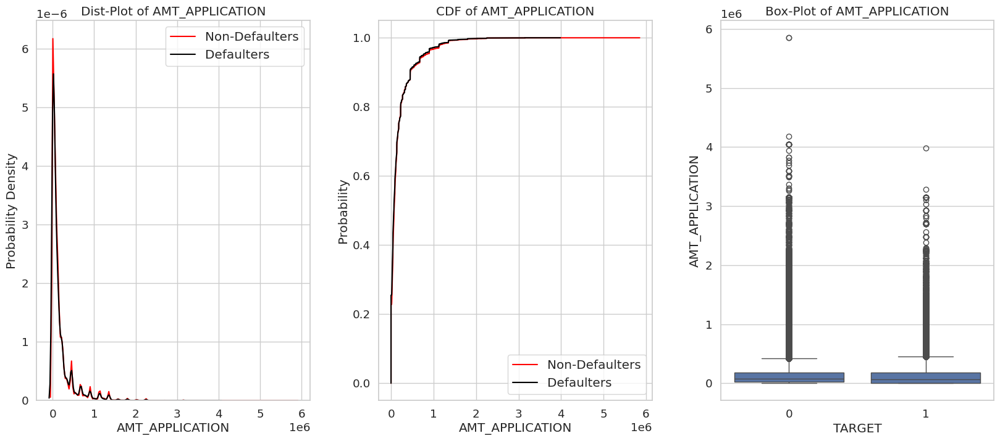

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




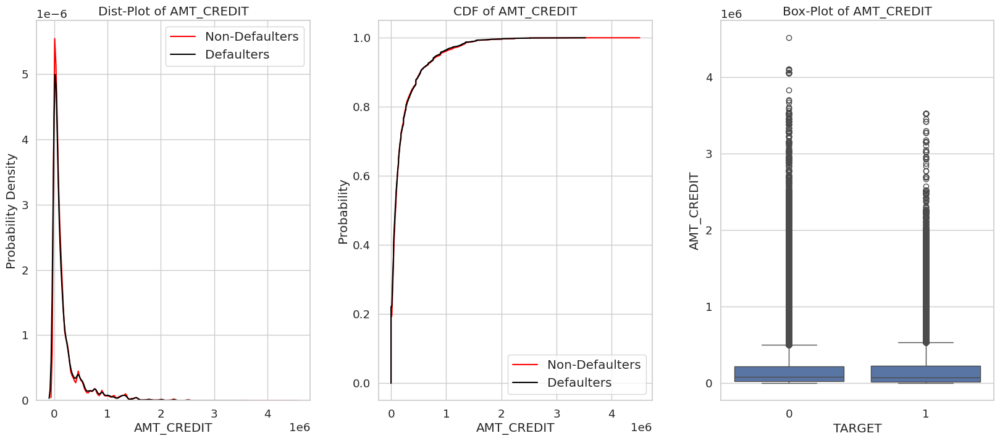

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




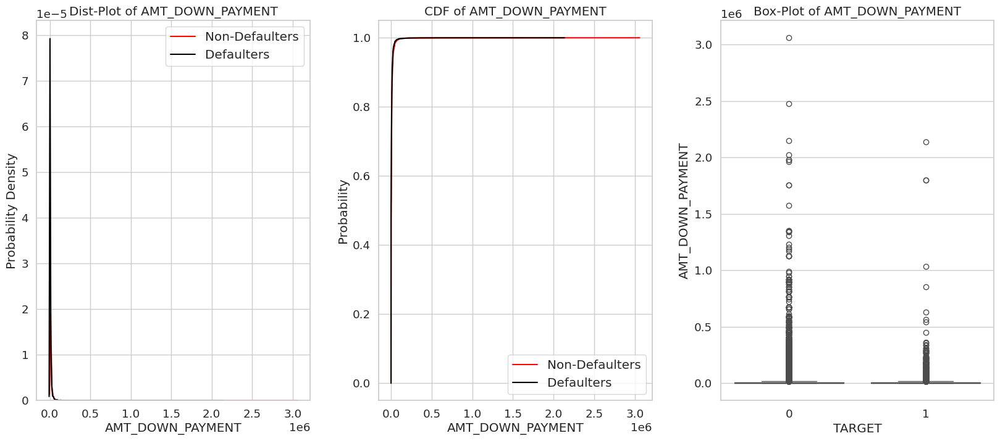

/tmp/ipykernel_2261849/3890439493.py:33: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/tmp/ipykernel_2261849/3890439493.py:35: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




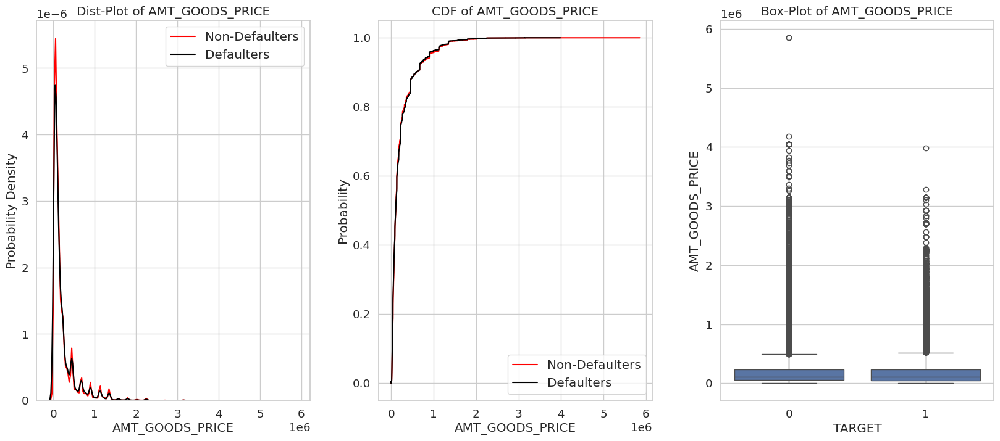

In [56]:
plot_continuous_variables(prev_merged, ["AMT_ANNUITY","AMT_APPLICATION","AMT_CREDIT","AMT_DOWN_PAYMENT","AMT_GOODS_PRICE"])

In [57]:
prev[prev["AMT_ANNUITY"].isna()& prev['NAME_CONTRACT_STATUS']=="Approved"]

,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,SK_ID_CURR


In [58]:
prev[prev["AMT_APPLICATION"].isna()& prev['NAME_CONTRACT_STATUS']=="Approved"]

,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,SK_ID_CURR


In [59]:
prev[prev["AMT_CREDIT"].isna()& prev['NAME_CONTRACT_STATUS']=="Approved"]

,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,SK_ID_CURR


In [60]:
prev[prev["AMT_DOWN_PAYMENT"].isna()& prev['NAME_CONTRACT_STATUS']=="Approved"]

,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,SK_ID_CURR


In [61]:
prev[prev["AMT_GOODS_PRICE"].isna()& prev['NAME_CONTRACT_STATUS']=="Approved"]

,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,SK_ID_CURR


#### WEEKDAY_APPR_PROCESS_START

hầu như bắt đầu vào weekday

/tmp/ipykernel_2261849/2758556838.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



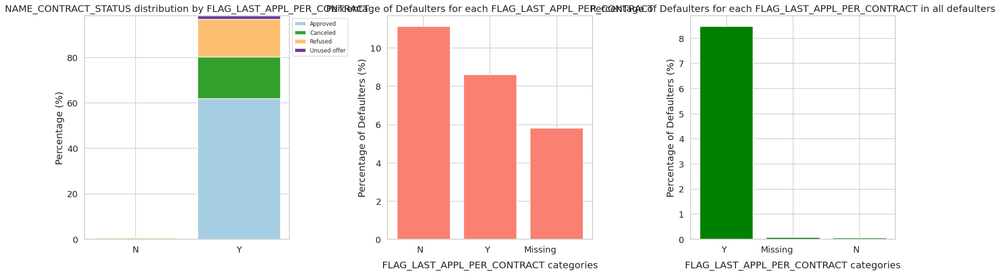

In [62]:
stack_plot_prev(prev_merged, ["FLAG_LAST_APPL_PER_CONTRACT"], "NAME_CONTRACT_STATUS")

In [63]:
prev_unique["WEEKDAY_APPR_PROCESS_START"]

{'counts': {'WEEK_DAY': 868535, 'WEEKEND': 275539},
 'percentages': {'WEEK_DAY': 75.916, 'WEEKEND': 24.084}}

In [64]:
prev_unique["FLAG_LAST_APPL_PER_CONTRACT"]

{'counts': {'Y': 1124974, nan: 13183, 'N': 5917},
 'percentages': {'Y': 98.331, nan: 1.152, 'N': 0.517}}

#### NFLAG_LAST_APPL_IN_DAY

/tmp/ipykernel_2261849/2758556838.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



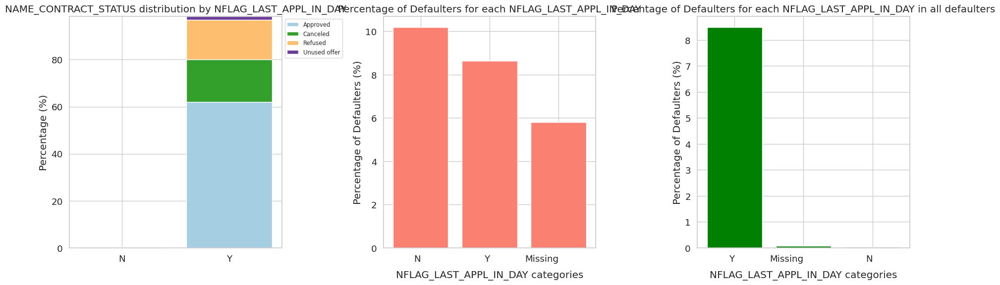

In [66]:
stack_plot_prev(prev_merged, ["NFLAG_LAST_APPL_IN_DAY"])

In [67]:
prev_unique["NAME_CASH_LOAN_PURPOSE"]

{'counts': {'XAP': 628865,
  'XNA': 454600,
  'Repairs': 16087,
  nan: 13183,
  'Other': 10716,
  'Urgent needs': 5793,
  'Buying a used car': 1995,
  'Building a house or an annex': 1866,
  'Everyday expenses': 1645,
  'Medicine': 1503,
  'Payments on other loans': 1248,
  'Education': 1054,
  'Journey': 823,
  'Purchase of electronic equipment': 746,
  'Buying a new car': 693,
  'Wedding / gift / holiday': 638,
  'Buying a home': 562,
  'Car repairs': 555,
  'Furniture': 525,
  'Buying a holiday home / land': 360,
  'Business development': 271,
  'Gasification / water supply': 192,
  'Buying a garage': 83,
  'Hobby': 38,
  'Money for a third person': 21,
  'Refusal to name the goal': 12},
 'percentages': {'XAP': 54.967,
  'XNA': 39.735,
  'Repairs': 1.406,
  nan: 1.152,
  'Other': 0.937,
  'Urgent needs': 0.506,
  'Buying a used car': 0.174,
  'Building a house or an annex': 0.163,
  'Everyday expenses': 0.144,
  'Medicine': 0.131,
  'Payments on other loans': 0.109,
  'Education': 0

In [68]:
# loan_purpose = ['Refusal to name the goal', 'Money for a third person', 'Buying a garage', 'Buying a garage', 'Gasification / water supply', 'Business development', 'Buying a holiday home / land', 'Furniture', 'Car repairs', 'Buying a home',  'Purchase of electronic equipment', 'Journey', 'Education', 'Payments on other loans', 'Medicine', 'Building a house or an annex']
# prev['NAME_CASH_LOAN_PURPOSE'] = prev['NAME_CASH_LOAN_PURPOSE'].replace(loan_purpose, 'Other')
# prev['NAME_CASH_LOAN_PURPOSE'] = prev['NAME_CASH_LOAN_PURPOSE'].replace(['Buying a new car', 'Buying a used car'], 'Buying a car')

# loan_purpose = ['Refusal to name the goal', 'Money for a third person', 'Buying a garage', 'Buying a garage', 'Gasification / water supply', 'Business development', 'Buying a holiday home / land', 'Furniture', 'Car repairs', 'Buying a home',  'Purchase of electronic equipment', 'Journey', 'Education', 'Payments on other loans', 'Medicine', 'Building a house or an annex']
# prev_merged['NAME_CASH_LOAN_PURPOSE'] = prev_merged['NAME_CASH_LOAN_PURPOSE'].replace(loan_purpose, 'Other')
# prev_merged['NAME_CASH_LOAN_PURPOSE'] = prev_merged['NAME_CASH_LOAN_PURPOSE'].replace(['Buying a new car', 'Buying a used car'], 'Buying a car')

#### DAYS_DECISION

/tmp/ipykernel_2261849/2758556838.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



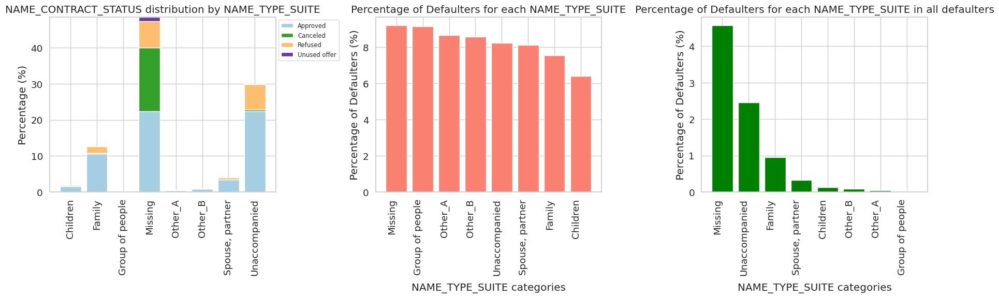

In [87]:
stack_plot_prev(prev_merged,[ "NAME_TYPE_SUITE"],rotation = 90)

In [75]:
prev_unique["NAME_TYPE_SUITE"]

{'counts': {nan: 568666,
  'Unaccompanied': 342534,
  'Family': 145191,
  'Spouse, partner': 46119,
  'Children': 21707,
  'Other_B': 12026,
  'Other_A': 6298,
  'Group of people': 1533},
 'percentages': {nan: 49.705,
  'Unaccompanied': 29.94,
  'Family': 12.691,
  'Spouse, partner': 4.031,
  'Children': 1.897,
  'Other_B': 1.051,
  'Other_A': 0.55,
  'Group of people': 0.134}}

- có đến 81% là XAP 
- ti le default của những người nhãn scorf là cao nhất 


#### NAME_CLIENT_TYPE

Most applicants are repeaters, and among them, the **XNA** category has the highest default rate. This suggests that repeat applicants in the **XNA** category may pose a higher risk of default compared to other groups.

/tmp/ipykernel_2261849/2758556838.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



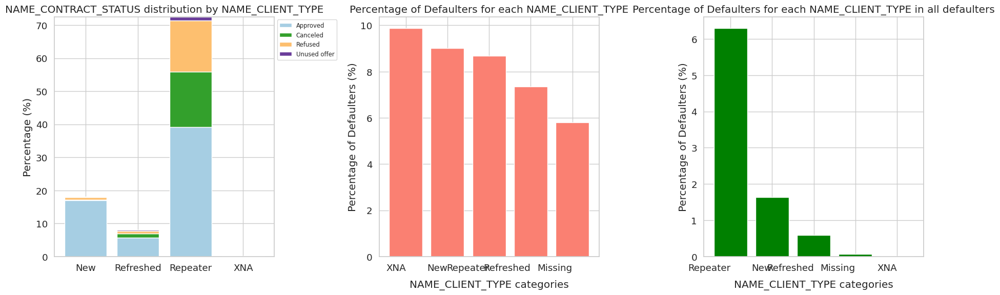

In [76]:
stack_plot_prev(prev_merged, ["NAME_CLIENT_TYPE"])

In [77]:
prev_unique["NAME_CLIENT_TYPE"]

{'counts': {'Repeater': 830032,
  'New': 207717,
  'Refreshed': 91897,
  nan: 13183,
  'XNA': 1245},
 'percentages': {'Repeater': 72.551,
  'New': 18.156,
  'Refreshed': 8.032,
  nan: 1.152,
  'XNA': 0.109}}

#### NAME_GOODS_CATEGORY

The **XNA** category in **goods category** has the largest share, and the highest default rates are observed in categories like **Vehicle XNA**, **Jewelry**, **Mobile**, **Weapon**, **Office Appliances**, and **Computers**. This suggests that certain goods categories, despite having a high proportion of missing data (XNA), are associated with higher default risks.

In [78]:
prev_unique["NAME_GOODS_CATEGORY"]

{'counts': {'XNA': 638118,
  'Mobile': 154909,
  'Consumer Electronics': 83526,
  'Computers': 71986,
  'Audio/Video': 68345,
  'Furniture': 36255,
  'Photo / Cinema Equipment': 17388,
  'Construction Materials': 17141,
  'Clothing and Accessories': 15674,
  nan: 13183,
  'Auto Accessories': 4999,
  'Jewelry': 4128,
  'Homewares': 3446,
  'Medical Supplies': 2586,
  'Vehicles': 2253,
  'Sport and Leisure': 2023,
  'Other': 1876,
  'Gardening': 1851,
  'Office Appliances': 1608,
  'Tourism': 1086,
  'Medicine': 1039,
  'Direct Sales': 267,
  'Fitness': 133,
  'Additional Service': 85,
  'Education': 68,
  'Insurance': 54,
  'Weapon': 47},
 'percentages': {'XNA': 55.776,
  'Mobile': 13.54,
  'Consumer Electronics': 7.301,
  'Computers': 6.292,
  'Audio/Video': 5.974,
  'Furniture': 3.169,
  'Photo / Cinema Equipment': 1.52,
  'Construction Materials': 1.498,
  'Clothing and Accessories': 1.37,
  nan: 1.152,
  'Auto Accessories': 0.437,
  'Jewelry': 0.361,
  'Homewares': 0.301,
  'Medical

Total Number of categories of NAME_GOODS_CATEGORY = 27


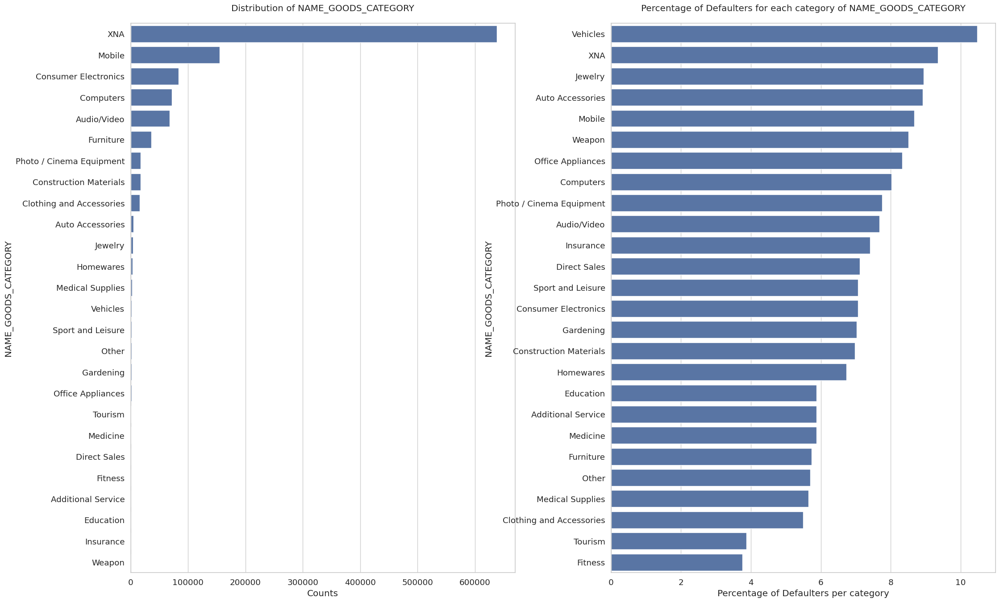

In [79]:
print(f"Total Number of categories of NAME_GOODS_CATEGORY = {len(prev_merged.NAME_GOODS_CATEGORY.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = prev_merged.NAME_GOODS_CATEGORY.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of NAME_GOODS_CATEGORY', pad = 20)
plt.xlabel('Counts')
plt.ylabel('NAME_GOODS_CATEGORY')

plt.subplot(1,2,2)
percentage_default_per_organization = prev_merged[prev_merged.TARGET == 1].NAME_GOODS_CATEGORY.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of NAME_GOODS_CATEGORY', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('NAME_GOODS_CATEGORY')

plt.show()

#### PRODUCT_COMBINATION

Total Number of categories of NAME_GOODS_CATEGORY = 18


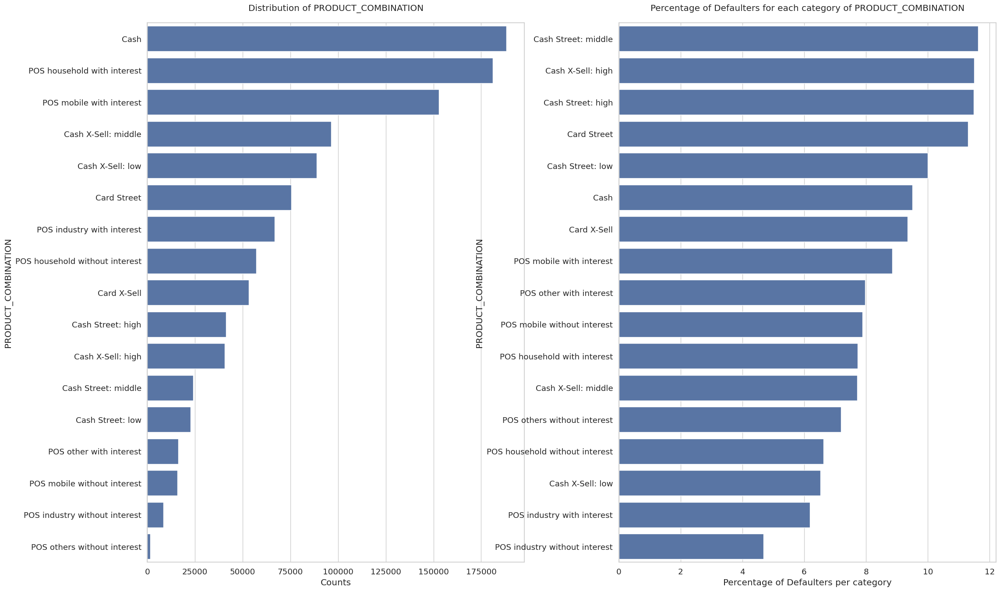

In [80]:
print(f"Total Number of categories of NAME_GOODS_CATEGORY = {len(prev_merged.PRODUCT_COMBINATION.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = prev_merged.PRODUCT_COMBINATION.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of PRODUCT_COMBINATION', pad = 20)
plt.xlabel('Counts')
plt.ylabel('PRODUCT_COMBINATION')

plt.subplot(1,2,2)
percentage_default_per_organization = prev_merged[prev_merged.TARGET == 1].PRODUCT_COMBINATION.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of PRODUCT_COMBINATION', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('PRODUCT_COMBINATION')

plt.show()

In [81]:
prev_unique["PRODUCT_COMBINATION"]

{'counts': {'Cash': 188262,
  'POS household with interest': 181002,
  'POS mobile with interest': 152876,
  'Cash X-Sell: middle': 96455,
  'Cash X-Sell: low': 88705,
  'Card Street': 75520,
  'POS industry with interest': 66744,
  'POS household without interest': 57027,
  'Card X-Sell': 53322,
  'Cash Street: high': 41356,
  'Cash X-Sell: high': 40544,
  'Cash Street: middle': 23976,
  'Cash Street: low': 22728,
  'POS other with interest': 16187,
  'POS mobile without interest': 15880,
  nan: 13420,
  'POS industry without interest': 8401,
  'POS others without interest': 1669},
 'percentages': {'Cash': 16.455,
  'POS household with interest': 15.821,
  'POS mobile with interest': 13.362,
  'Cash X-Sell: middle': 8.431,
  'Cash X-Sell: low': 7.753,
  'Card Street': 6.601,
  'POS industry with interest': 5.834,
  'POS household without interest': 4.985,
  'Card X-Sell': 4.661,
  'Cash Street: high': 3.615,
  'Cash X-Sell: high': 3.544,
  'Cash Street: middle': 2.096,
  'Cash Street:

#### NAME_CASH_LOAN_PURPOSE

The categories **XAP** and **XNA** have the highest proportion in the **purpose** feature, but their default rates are relatively low, ranking 4th (below 10%). The highest default rates are observed in categories like **Refusal to Name the Goal**, **Hobby**, **Car Repairs**, **Urgent Needs**, and **Payments on Other Loans**, indicating that applicants with these purposes tend to have a higher likelihood of defaulting.

Total Number of categories of NAME_GOODS_CATEGORY = 26


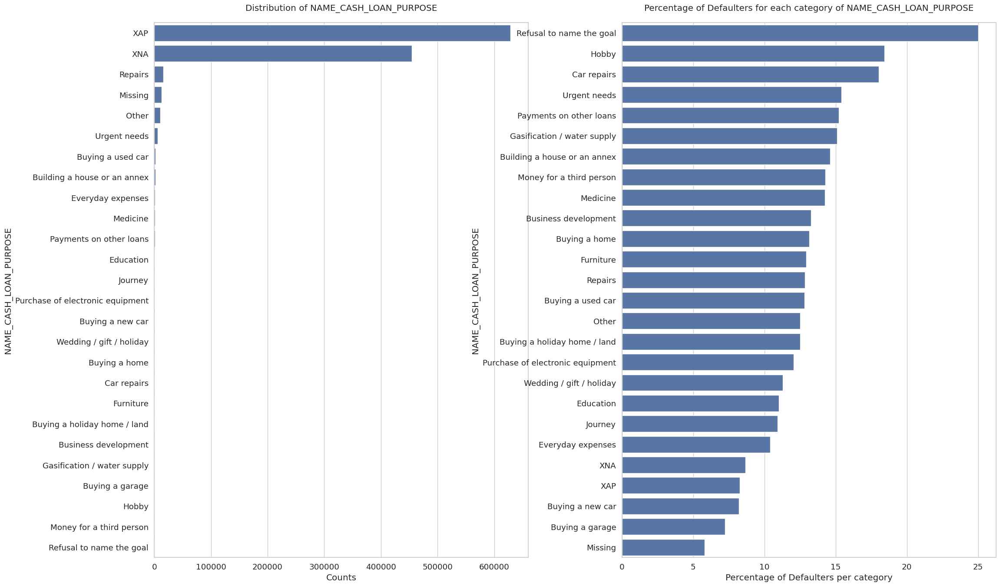

In [82]:
print(f"Total Number of categories of NAME_GOODS_CATEGORY = {len(prev_merged.NAME_CASH_LOAN_PURPOSE.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = prev_merged.NAME_CASH_LOAN_PURPOSE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of NAME_CASH_LOAN_PURPOSE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('NAME_CASH_LOAN_PURPOSE')

plt.subplot(1,2,2)
percentage_default_per_organization = prev_merged[prev_merged.TARGET == 1].NAME_CASH_LOAN_PURPOSE.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title('Percentage of Defaulters for each category of NAME_CASH_LOAN_PURPOSE', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('NAME_CASH_LOAN_PURPOSE')

plt.show()

#### NAME_TYPE_SUITE 
Most applicants are **unaccompanied**, and while the **group of people** category has the fewest applications, it exhibits the highest default rate. Interestingly, **accompanied** applicants have the largest number of applications, but their default rate ranks second, following the **group of people** and **other** categories. This suggests that even though accompanied applicants are more numerous, they tend to default less frequently compared to other groups.

Total Number of unique categories of NAME_TYPE_SUITE = 8


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




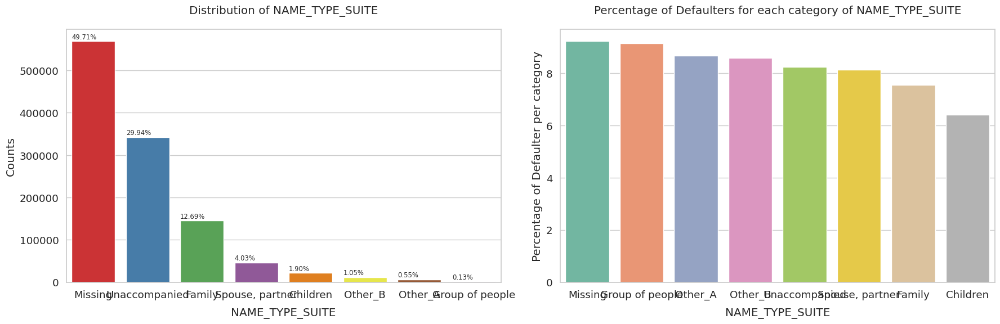

In [83]:
plot_categorical_variables_bar(prev_merged, ['NAME_TYPE_SUITE'])

#### NAME_PORTFOLIO

1. **High Application Rate for POS Loans**: The most applications are for **POS (Point of Sale)** loans, followed by **Cash** loans, **XNA**, **Cards**, and lastly, **Cars**, with **Cars** having the least number of applications (just 0.025%).

2. **Default Rate Trends**: Although POS loans have the highest number of applications, **Cards** have the highest default rate (over 10%), followed by **XNA**, **Cash**, **POS**, and **Cars**. This suggests that despite POS loans being the most common, the **Cards** category carries the highest risk of default. 

This highlights the importance of understanding the risks associated with different loan types, especially for categories like **Cards**, despite their relatively lower application volume.

Total Number of unique categories of NAME_PORTFOLIO = 6


/tmp/ipykernel_2261849/3001741072.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2261849/3001741072.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




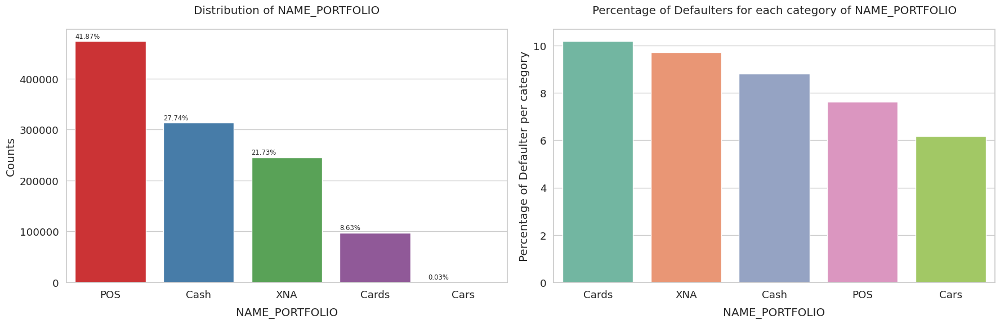

In [84]:
plot_categorical_variables_bar(prev_merged, ["NAME_PORTFOLIO"])

In [85]:
prev_unique['NAME_PORTFOLIO']

{'counts': {'POS': 473553,
  'Cash': 313764,
  'XNA': 245710,
  'Cards': 97573,
  nan: 13183,
  'Cars': 291},
 'percentages': {'POS': 41.392,
  'Cash': 27.425,
  'XNA': 21.477,
  'Cards': 8.529,
  nan: 1.152,
  'Cars': 0.025}}

#### CHANNEL_TYPE

1. **Channel Distribution**: 
   - **Most Popular Channels**: The majority of loan applications were acquired through **Credit and Cash Offices** (>40%) and **Country-wide Channels** (>29%). This indicates that these are the primary sources of applications for Home Credit.
   - **Other Channels**: The remaining channels make up a smaller proportion of total applications, suggesting they are niche or less frequently used.

2. **Default Rates by Channel Type**:
   - **High Default Rate in AP+ (Cash Loan)**: Applications processed through the **AP+ (Cash loan)** channel had the highest default rate (13%). This suggests that while this channel may attract a large number of applicants, it also carries a higher financial risk, possibly due to the nature of cash loans.
   - **Low Default Rate in Car Dealer Channel**: In contrast, **Car Dealer** loans had the lowest default rate at only 5%, indicating that loans tied to car purchases may be more secure or have more stable repayment behaviors.
   
3. **Risk Implications**:
   - **Higher Default Risk in AP+ (Cash Loan)**: The higher default rate in the **AP+ (Cash loan)** category suggests that this channel may attract higher-risk clients. This could indicate financial instability or poor creditworthiness among those who apply through this channel.
   - **Stability in Car Dealer Channel**: The low default rate observed in **Car Dealer** loans may imply that these types of loans are more secure, possibly because the collateral (the car) mitigates the lender’s risk.


/tmp/ipykernel_2261849/2758556838.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



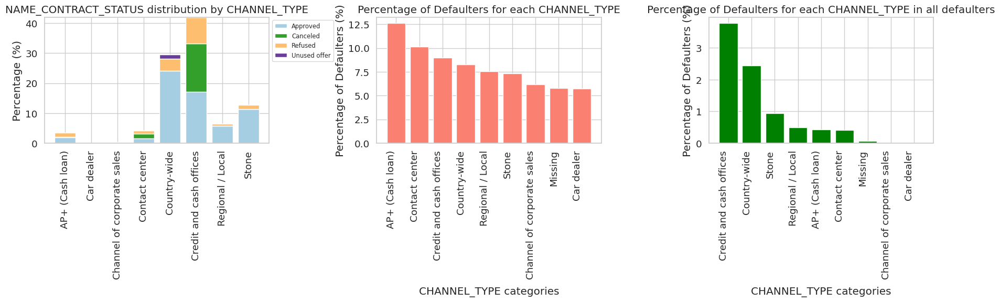

In [86]:
stack_plot_prev(prev_merged,["CHANNEL_TYPE"], rotation = 90)